# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = '/input'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

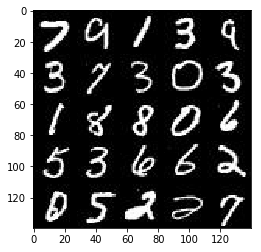

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

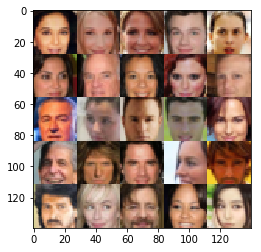

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
# 输入图像占位符: 使用 image_width，image_height 和 image_channels 设置为 rank 4。
# 输入 Z 占位符: 设置为 rank 2，并命名为 z_dim。
# 学习速率占位符: 设置为 rank 0。
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    in_learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')
    return input_real, input_z, in_learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator

Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [7]:
def discriminator(images, reuse=False, alpha=0.1, stddev=0.02):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        # Layer 1 in: 28x28x(1|3)
        layer_1 = tf.layers.conv2d(images, 32, 5, 2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        layer_1 = tf.maximum(alpha * layer_1, layer_1)
        # Layer 1 out: 14x14x32
        
        # Layer 2: 14x14x32
        layer_2 = tf.layers.conv2d(layer_1, 64, 5, 2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        layer_2 = tf.layers.batch_normalization(layer_2, training=True)
        layer_2 = tf.maximum(alpha * layer_2, layer_2)
        # Layer 2 out: 7x7x64
        
        layer_3 = tf.layers.conv2d(layer_2, 128, 5, 2, padding='same',  kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        layer_3 = tf.layers.batch_normalization(layer_3, training=True)
        layer_3 = tf.maximum(alpha * layer_3, layer_3)
        # Layer 3 out: 4x4x128
        
        layer_4 = tf.layers.conv2d(layer_3, 256, 5, 2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        layer_4 = tf.layers.batch_normalization(layer_4, training=True)
        layer_4 = tf.maximum(alpha * layer_4, layer_4)
        # Layer 4 out: 2x2x256
        
        flattened = tf.reshape(layer_4, (-1, 2*2*256))
        logits = tf.layers.dense(flattened, 1, kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        output = tf.sigmoid(logits)
        
        return output, logits
        
        


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
#部署 generator 函数以使用 z 生成图像。该函数应能够重复使用神经网络中的各种变量。 在 tf.variable_scope 中使用 "generator" 的变量空间名来重复使用该函数中的变量。
def generator(z, out_channel_dim, is_train=True, alpha=0.1, stddev=0.02):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        # Layer 1 in: 7x7x256
        layer_1 = tf.layers.dense(z, 4 * 4 * 512)
        layer_1 = tf.reshape(layer_1, (-1, 4, 4, 512))
        layer_1 = tf.layers.batch_normalization(layer_1, training=is_train)
        layer_1 = tf.maximum(alpha * layer_1, layer_1)
        # Layer 1 out: 4x4x512
        
        layer_2 = tf.layers.conv2d_transpose(layer_1, 128, 4, 1, padding='valid', kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        layer_2 = tf.layers.batch_normalization(layer_2, training=is_train)
        layer_2 = tf.maximum(alpha * layer_2, layer_2)
        # Layer 2 out: 8x8x128
        
        layer_3 = tf.layers.conv2d_transpose(layer_2, 64, 5, 2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        layer_3 = tf.layers.batch_normalization(layer_3, training=is_train)
        layer_3 = tf.maximum(alpha * layer_3, layer_3)
        # Layer 3 out: 16x16x64
        
        layer_4 = tf.layers.conv2d_transpose(layer_3, 32, 5, 2, padding='same',kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        layer_4 = tf.layers.batch_normalization(layer_4, training=is_train)
        layer_4 = tf.maximum(alpha * layer_4, layer_4)
        # Layer 4 out: 32x32x32
        
        logits = tf.layers.conv2d_transpose(layer_4, out_channel_dim, 3, 1, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=stddev))
        output = tf.tanh(logits)
        
        return output
        


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    gen_model = generator(input_z, out_channel_dim)
    dis_model_real, dis_logits_real = discriminator(input_real)
    dis_model_fake, dis_logits_fake = discriminator(gen_model, reuse=True)
    
    dis_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dis_logits_real, labels=tf.ones_like(dis_logits_real) * 0.9))
    dis_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dis_logits_fake, labels=tf.zeros_like(dis_logits_fake)))
    dis_loss = dis_loss_real + dis_loss_fake
    gen_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dis_logits_fake, labels=tf.ones_like(dis_logits_fake)))
    
    return dis_loss, gen_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    train_vars = tf.trainable_variables()
    dis_vars = [var for var in train_vars if var.name.startswith('discriminator')]
    gen_vars = [var for var in train_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        dis_train_ops = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=dis_vars)
        gen_train_ops = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=gen_vars)
    
        return dis_train_ops, gen_train_ops


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    _, image_width, image_height, image_channels = data_shape
    
    input_real, input_z, in_learning_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    dis_loss, gen_loss = model_loss(input_real, input_z, image_channels)
    dis_ops, gen_ops = model_opt(dis_loss, gen_loss, learning_rate, beta1)
    
    steps = 0
    
    print_every = 10
    show_every = 100
    
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                batch_images *= 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(dis_ops, feed_dict={ input_real: batch_images, input_z: batch_z, in_learning_rate: learning_rate })
                _ = sess.run(gen_ops, feed_dict={ input_z: batch_z, in_learning_rate: learning_rate })
                
                if steps % print_every == 0:
                    dis_loss_train = dis_loss.eval({
                        input_z: batch_z,
                        input_real: batch_images
                    })
                    gen_loss_train = gen_loss.eval({
                        input_z: batch_z
                    })
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                         "Discriminator Loss: {:.4f}...".format(dis_loss_train),
                         "Generator Loss: {:.4f}".format(gen_loss_train))
                    
                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, image_channels, data_image_mode)
                    
            
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5090... Generator Loss: 1.9246
Epoch 1/2... Discriminator Loss: 2.3742... Generator Loss: 0.1520
Epoch 1/2... Discriminator Loss: 0.7298... Generator Loss: 1.8811
Epoch 1/2... Discriminator Loss: 0.7608... Generator Loss: 2.8885
Epoch 1/2... Discriminator Loss: 1.2227... Generator Loss: 0.6636
Epoch 1/2... Discriminator Loss: 0.6700... Generator Loss: 1.3484
Epoch 1/2... Discriminator Loss: 0.4436... Generator Loss: 2.3844
Epoch 1/2... Discriminator Loss: 0.6102... Generator Loss: 1.6049
Epoch 1/2... Discriminator Loss: 0.6872... Generator Loss: 3.3861
Epoch 1/2... Discriminator Loss: 0.5705... Generator Loss: 1.7559


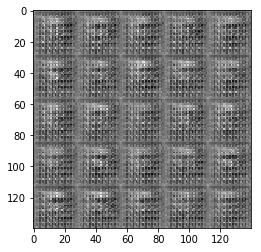

Epoch 1/2... Discriminator Loss: 0.5871... Generator Loss: 2.0850
Epoch 1/2... Discriminator Loss: 0.6749... Generator Loss: 1.4091
Epoch 1/2... Discriminator Loss: 1.9743... Generator Loss: 0.2887
Epoch 1/2... Discriminator Loss: 1.0641... Generator Loss: 0.9530
Epoch 1/2... Discriminator Loss: 0.8196... Generator Loss: 1.4637
Epoch 1/2... Discriminator Loss: 1.0444... Generator Loss: 0.9671
Epoch 1/2... Discriminator Loss: 0.8862... Generator Loss: 1.2545
Epoch 1/2... Discriminator Loss: 0.9260... Generator Loss: 1.0920
Epoch 1/2... Discriminator Loss: 0.8718... Generator Loss: 1.5353
Epoch 1/2... Discriminator Loss: 1.4908... Generator Loss: 0.4830


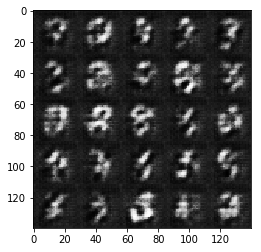

Epoch 1/2... Discriminator Loss: 0.9372... Generator Loss: 1.3297
Epoch 1/2... Discriminator Loss: 0.8088... Generator Loss: 1.1989
Epoch 1/2... Discriminator Loss: 1.0688... Generator Loss: 2.5007
Epoch 1/2... Discriminator Loss: 0.8080... Generator Loss: 1.6954
Epoch 1/2... Discriminator Loss: 0.9010... Generator Loss: 1.3658
Epoch 1/2... Discriminator Loss: 0.8078... Generator Loss: 1.8770
Epoch 1/2... Discriminator Loss: 1.3920... Generator Loss: 2.8739
Epoch 1/2... Discriminator Loss: 0.8725... Generator Loss: 1.4362
Epoch 1/2... Discriminator Loss: 0.9002... Generator Loss: 1.0974
Epoch 1/2... Discriminator Loss: 0.8775... Generator Loss: 0.9572


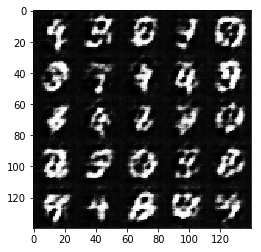

Epoch 1/2... Discriminator Loss: 0.9618... Generator Loss: 0.9622
Epoch 1/2... Discriminator Loss: 0.7185... Generator Loss: 1.4542
Epoch 1/2... Discriminator Loss: 1.4493... Generator Loss: 0.4817
Epoch 1/2... Discriminator Loss: 0.9029... Generator Loss: 0.9980
Epoch 1/2... Discriminator Loss: 0.7379... Generator Loss: 1.4251
Epoch 1/2... Discriminator Loss: 1.3917... Generator Loss: 0.5091
Epoch 1/2... Discriminator Loss: 0.8297... Generator Loss: 1.7577
Epoch 1/2... Discriminator Loss: 0.9669... Generator Loss: 2.0712
Epoch 1/2... Discriminator Loss: 1.9886... Generator Loss: 0.2634
Epoch 1/2... Discriminator Loss: 0.8363... Generator Loss: 1.2336


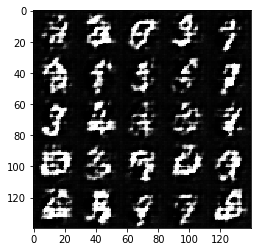

Epoch 1/2... Discriminator Loss: 1.2031... Generator Loss: 2.3045
Epoch 1/2... Discriminator Loss: 1.2039... Generator Loss: 0.6273
Epoch 1/2... Discriminator Loss: 0.8638... Generator Loss: 1.8883
Epoch 1/2... Discriminator Loss: 0.8731... Generator Loss: 1.5029
Epoch 1/2... Discriminator Loss: 0.8923... Generator Loss: 1.2400
Epoch 1/2... Discriminator Loss: 0.7851... Generator Loss: 1.6176
Epoch 1/2... Discriminator Loss: 1.4873... Generator Loss: 0.4281
Epoch 1/2... Discriminator Loss: 1.0377... Generator Loss: 0.9616
Epoch 1/2... Discriminator Loss: 1.6234... Generator Loss: 2.6165
Epoch 1/2... Discriminator Loss: 0.8733... Generator Loss: 1.0933


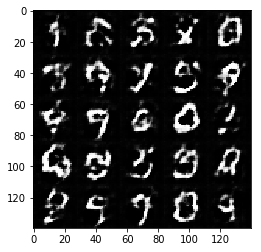

Epoch 1/2... Discriminator Loss: 0.7804... Generator Loss: 1.3876
Epoch 1/2... Discriminator Loss: 1.1402... Generator Loss: 0.7027
Epoch 1/2... Discriminator Loss: 1.1710... Generator Loss: 0.6539
Epoch 1/2... Discriminator Loss: 0.8955... Generator Loss: 1.3144
Epoch 1/2... Discriminator Loss: 0.9019... Generator Loss: 1.0169
Epoch 1/2... Discriminator Loss: 1.0509... Generator Loss: 1.8166
Epoch 1/2... Discriminator Loss: 0.9216... Generator Loss: 1.1667
Epoch 1/2... Discriminator Loss: 1.1526... Generator Loss: 0.7770
Epoch 1/2... Discriminator Loss: 0.9115... Generator Loss: 1.1466
Epoch 1/2... Discriminator Loss: 1.0124... Generator Loss: 1.0109


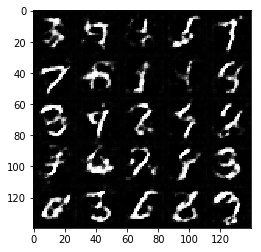

Epoch 1/2... Discriminator Loss: 0.8153... Generator Loss: 1.3776
Epoch 1/2... Discriminator Loss: 1.2014... Generator Loss: 0.6514
Epoch 1/2... Discriminator Loss: 1.5720... Generator Loss: 0.4018
Epoch 1/2... Discriminator Loss: 1.0181... Generator Loss: 0.9394
Epoch 1/2... Discriminator Loss: 0.9573... Generator Loss: 1.7601
Epoch 1/2... Discriminator Loss: 0.8318... Generator Loss: 1.4222
Epoch 1/2... Discriminator Loss: 0.9053... Generator Loss: 1.2255
Epoch 1/2... Discriminator Loss: 1.0266... Generator Loss: 1.2346
Epoch 1/2... Discriminator Loss: 1.3612... Generator Loss: 2.4421
Epoch 1/2... Discriminator Loss: 1.0162... Generator Loss: 1.0284


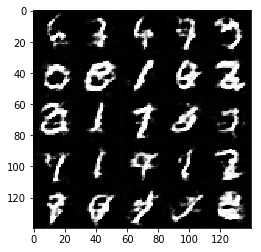

Epoch 1/2... Discriminator Loss: 1.0366... Generator Loss: 1.0601
Epoch 1/2... Discriminator Loss: 1.5881... Generator Loss: 0.3988
Epoch 1/2... Discriminator Loss: 0.9425... Generator Loss: 1.5453
Epoch 1/2... Discriminator Loss: 0.9382... Generator Loss: 0.9448
Epoch 1/2... Discriminator Loss: 0.9347... Generator Loss: 0.8569
Epoch 1/2... Discriminator Loss: 1.2419... Generator Loss: 0.5768
Epoch 1/2... Discriminator Loss: 0.8689... Generator Loss: 1.5843
Epoch 1/2... Discriminator Loss: 1.7638... Generator Loss: 0.3111
Epoch 1/2... Discriminator Loss: 1.0022... Generator Loss: 1.4368
Epoch 1/2... Discriminator Loss: 1.1500... Generator Loss: 1.7704


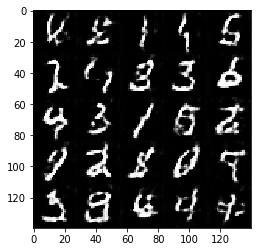

Epoch 1/2... Discriminator Loss: 1.1655... Generator Loss: 0.6658
Epoch 1/2... Discriminator Loss: 0.8943... Generator Loss: 1.3242
Epoch 1/2... Discriminator Loss: 0.9799... Generator Loss: 0.9033
Epoch 1/2... Discriminator Loss: 0.9516... Generator Loss: 1.0554
Epoch 1/2... Discriminator Loss: 0.9228... Generator Loss: 1.0211
Epoch 1/2... Discriminator Loss: 2.0234... Generator Loss: 0.2238
Epoch 1/2... Discriminator Loss: 1.0230... Generator Loss: 1.9066
Epoch 1/2... Discriminator Loss: 0.7788... Generator Loss: 1.2837
Epoch 1/2... Discriminator Loss: 0.7766... Generator Loss: 1.2050
Epoch 1/2... Discriminator Loss: 1.0695... Generator Loss: 0.7851


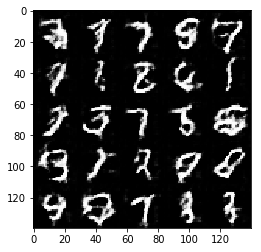

Epoch 1/2... Discriminator Loss: 1.4931... Generator Loss: 0.4543
Epoch 1/2... Discriminator Loss: 0.8478... Generator Loss: 2.4075
Epoch 1/2... Discriminator Loss: 0.9912... Generator Loss: 0.8407
Epoch 1/2... Discriminator Loss: 0.8293... Generator Loss: 1.0667
Epoch 1/2... Discriminator Loss: 1.1103... Generator Loss: 0.7197
Epoch 1/2... Discriminator Loss: 0.9523... Generator Loss: 1.0032
Epoch 1/2... Discriminator Loss: 0.7948... Generator Loss: 1.7877
Epoch 1/2... Discriminator Loss: 0.7765... Generator Loss: 1.4285
Epoch 1/2... Discriminator Loss: 1.1192... Generator Loss: 0.7496
Epoch 1/2... Discriminator Loss: 1.2998... Generator Loss: 0.5440


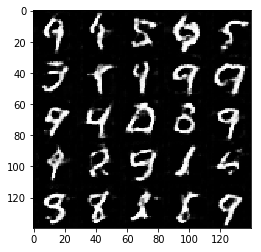

Epoch 1/2... Discriminator Loss: 0.7701... Generator Loss: 1.4246
Epoch 1/2... Discriminator Loss: 1.0332... Generator Loss: 0.8141
Epoch 1/2... Discriminator Loss: 0.7863... Generator Loss: 1.2292
Epoch 1/2... Discriminator Loss: 1.0490... Generator Loss: 0.7803
Epoch 1/2... Discriminator Loss: 1.0833... Generator Loss: 0.7614
Epoch 1/2... Discriminator Loss: 0.9691... Generator Loss: 0.8626
Epoch 1/2... Discriminator Loss: 1.1666... Generator Loss: 0.6911
Epoch 1/2... Discriminator Loss: 1.0749... Generator Loss: 0.7785
Epoch 1/2... Discriminator Loss: 1.0686... Generator Loss: 0.7411
Epoch 1/2... Discriminator Loss: 0.9997... Generator Loss: 1.0054


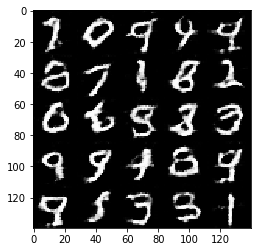

Epoch 1/2... Discriminator Loss: 1.2753... Generator Loss: 0.5517
Epoch 1/2... Discriminator Loss: 1.0617... Generator Loss: 0.7421
Epoch 1/2... Discriminator Loss: 1.0828... Generator Loss: 0.9457
Epoch 1/2... Discriminator Loss: 0.7977... Generator Loss: 1.3569
Epoch 1/2... Discriminator Loss: 1.0619... Generator Loss: 1.9359
Epoch 1/2... Discriminator Loss: 1.4907... Generator Loss: 0.4250
Epoch 1/2... Discriminator Loss: 0.7889... Generator Loss: 1.5810
Epoch 1/2... Discriminator Loss: 0.8156... Generator Loss: 1.3378
Epoch 1/2... Discriminator Loss: 1.0896... Generator Loss: 0.7504
Epoch 1/2... Discriminator Loss: 1.2825... Generator Loss: 0.5427


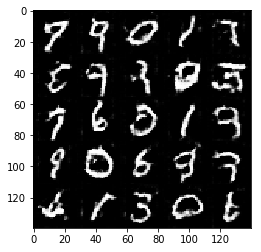

Epoch 1/2... Discriminator Loss: 0.8666... Generator Loss: 1.0808
Epoch 1/2... Discriminator Loss: 0.8468... Generator Loss: 1.1182
Epoch 1/2... Discriminator Loss: 0.8673... Generator Loss: 1.4287
Epoch 1/2... Discriminator Loss: 0.8590... Generator Loss: 1.2032
Epoch 1/2... Discriminator Loss: 1.3050... Generator Loss: 0.5309
Epoch 1/2... Discriminator Loss: 0.9233... Generator Loss: 0.9848
Epoch 1/2... Discriminator Loss: 0.8984... Generator Loss: 1.2147
Epoch 1/2... Discriminator Loss: 0.9535... Generator Loss: 1.2648
Epoch 1/2... Discriminator Loss: 1.0861... Generator Loss: 0.7039
Epoch 1/2... Discriminator Loss: 1.1767... Generator Loss: 0.6538


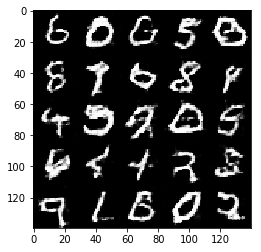

Epoch 1/2... Discriminator Loss: 1.0480... Generator Loss: 0.8232
Epoch 1/2... Discriminator Loss: 1.2408... Generator Loss: 0.6276
Epoch 1/2... Discriminator Loss: 0.9712... Generator Loss: 1.0803
Epoch 1/2... Discriminator Loss: 1.5886... Generator Loss: 0.3699
Epoch 1/2... Discriminator Loss: 0.8358... Generator Loss: 1.0747
Epoch 1/2... Discriminator Loss: 1.2933... Generator Loss: 0.5410
Epoch 1/2... Discriminator Loss: 0.9356... Generator Loss: 0.9273
Epoch 1/2... Discriminator Loss: 1.4156... Generator Loss: 0.4881
Epoch 1/2... Discriminator Loss: 0.9669... Generator Loss: 0.9181
Epoch 1/2... Discriminator Loss: 1.7562... Generator Loss: 0.2935


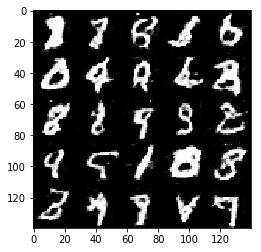

Epoch 1/2... Discriminator Loss: 0.7479... Generator Loss: 1.4571
Epoch 1/2... Discriminator Loss: 1.0427... Generator Loss: 2.8730
Epoch 1/2... Discriminator Loss: 0.7444... Generator Loss: 1.2219
Epoch 1/2... Discriminator Loss: 1.6773... Generator Loss: 0.3601
Epoch 1/2... Discriminator Loss: 1.1942... Generator Loss: 0.6187
Epoch 1/2... Discriminator Loss: 0.9641... Generator Loss: 1.0556
Epoch 1/2... Discriminator Loss: 0.9504... Generator Loss: 0.9124
Epoch 1/2... Discriminator Loss: 1.0361... Generator Loss: 0.7686
Epoch 1/2... Discriminator Loss: 0.9856... Generator Loss: 0.8397
Epoch 1/2... Discriminator Loss: 1.3341... Generator Loss: 0.5007


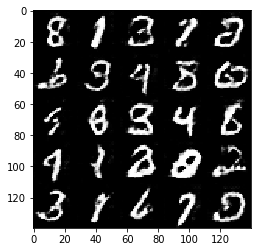

Epoch 1/2... Discriminator Loss: 0.9374... Generator Loss: 0.9997
Epoch 1/2... Discriminator Loss: 1.0266... Generator Loss: 0.7490
Epoch 1/2... Discriminator Loss: 1.3207... Generator Loss: 0.5085
Epoch 1/2... Discriminator Loss: 1.0322... Generator Loss: 1.0577
Epoch 1/2... Discriminator Loss: 0.8744... Generator Loss: 1.6110
Epoch 1/2... Discriminator Loss: 1.1798... Generator Loss: 0.6044
Epoch 1/2... Discriminator Loss: 0.8764... Generator Loss: 1.2068
Epoch 1/2... Discriminator Loss: 1.3274... Generator Loss: 0.5168
Epoch 1/2... Discriminator Loss: 0.9584... Generator Loss: 0.9573
Epoch 1/2... Discriminator Loss: 1.5646... Generator Loss: 0.3618


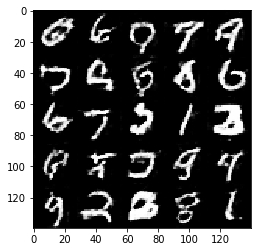

Epoch 1/2... Discriminator Loss: 0.7280... Generator Loss: 1.3046
Epoch 1/2... Discriminator Loss: 1.7017... Generator Loss: 0.3586
Epoch 1/2... Discriminator Loss: 0.7945... Generator Loss: 1.2106
Epoch 1/2... Discriminator Loss: 1.0643... Generator Loss: 0.7221
Epoch 1/2... Discriminator Loss: 1.2780... Generator Loss: 0.5656
Epoch 1/2... Discriminator Loss: 0.8563... Generator Loss: 1.5499
Epoch 1/2... Discriminator Loss: 1.1129... Generator Loss: 0.6787
Epoch 1/2... Discriminator Loss: 0.8037... Generator Loss: 1.2399
Epoch 1/2... Discriminator Loss: 0.9565... Generator Loss: 0.9873
Epoch 1/2... Discriminator Loss: 1.1185... Generator Loss: 0.6600


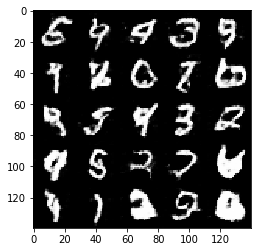

Epoch 1/2... Discriminator Loss: 0.9317... Generator Loss: 1.1496
Epoch 1/2... Discriminator Loss: 1.1443... Generator Loss: 0.6919
Epoch 1/2... Discriminator Loss: 0.6221... Generator Loss: 2.1005
Epoch 1/2... Discriminator Loss: 0.9858... Generator Loss: 1.8371
Epoch 1/2... Discriminator Loss: 1.0030... Generator Loss: 0.8231
Epoch 1/2... Discriminator Loss: 1.5504... Generator Loss: 0.3783
Epoch 1/2... Discriminator Loss: 0.6608... Generator Loss: 1.5852
Epoch 1/2... Discriminator Loss: 1.3807... Generator Loss: 0.4946
Epoch 1/2... Discriminator Loss: 0.8965... Generator Loss: 0.9080
Epoch 1/2... Discriminator Loss: 0.7962... Generator Loss: 1.4213


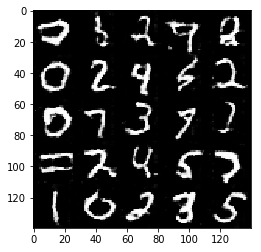

Epoch 1/2... Discriminator Loss: 2.1508... Generator Loss: 0.2214
Epoch 1/2... Discriminator Loss: 1.1156... Generator Loss: 0.7078
Epoch 1/2... Discriminator Loss: 1.4449... Generator Loss: 0.4522
Epoch 1/2... Discriminator Loss: 0.9453... Generator Loss: 0.9634
Epoch 1/2... Discriminator Loss: 0.7299... Generator Loss: 1.8990
Epoch 1/2... Discriminator Loss: 0.9040... Generator Loss: 1.3366
Epoch 1/2... Discriminator Loss: 1.0152... Generator Loss: 0.7730
Epoch 2/2... Discriminator Loss: 0.8634... Generator Loss: 1.0352
Epoch 2/2... Discriminator Loss: 0.8121... Generator Loss: 1.3936
Epoch 2/2... Discriminator Loss: 0.9252... Generator Loss: 0.9080


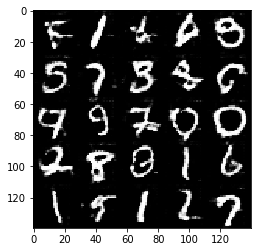

Epoch 2/2... Discriminator Loss: 0.9653... Generator Loss: 0.8332
Epoch 2/2... Discriminator Loss: 0.8756... Generator Loss: 1.9621
Epoch 2/2... Discriminator Loss: 0.9001... Generator Loss: 1.0558
Epoch 2/2... Discriminator Loss: 0.7680... Generator Loss: 1.1352
Epoch 2/2... Discriminator Loss: 0.7204... Generator Loss: 1.2571
Epoch 2/2... Discriminator Loss: 0.6034... Generator Loss: 1.9152
Epoch 2/2... Discriminator Loss: 1.2562... Generator Loss: 0.6129
Epoch 2/2... Discriminator Loss: 1.1478... Generator Loss: 0.6894
Epoch 2/2... Discriminator Loss: 1.3083... Generator Loss: 0.5528
Epoch 2/2... Discriminator Loss: 0.8486... Generator Loss: 1.0177


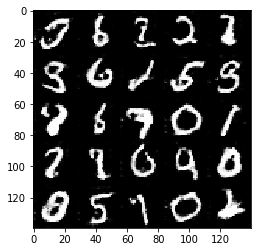

Epoch 2/2... Discriminator Loss: 1.0142... Generator Loss: 0.8015
Epoch 2/2... Discriminator Loss: 1.0509... Generator Loss: 0.9190
Epoch 2/2... Discriminator Loss: 1.1879... Generator Loss: 1.9600
Epoch 2/2... Discriminator Loss: 0.6229... Generator Loss: 2.3572
Epoch 2/2... Discriminator Loss: 1.4591... Generator Loss: 0.4613
Epoch 2/2... Discriminator Loss: 1.2753... Generator Loss: 0.5397
Epoch 2/2... Discriminator Loss: 1.7144... Generator Loss: 0.3444
Epoch 2/2... Discriminator Loss: 1.1541... Generator Loss: 0.6354
Epoch 2/2... Discriminator Loss: 1.1508... Generator Loss: 0.6604
Epoch 2/2... Discriminator Loss: 1.4197... Generator Loss: 0.4700


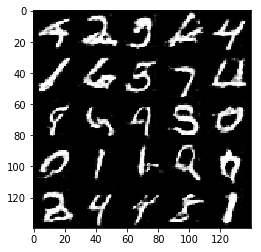

Epoch 2/2... Discriminator Loss: 0.8839... Generator Loss: 0.9875
Epoch 2/2... Discriminator Loss: 1.0619... Generator Loss: 1.5933
Epoch 2/2... Discriminator Loss: 1.2186... Generator Loss: 0.5797
Epoch 2/2... Discriminator Loss: 0.7923... Generator Loss: 1.1044
Epoch 2/2... Discriminator Loss: 0.9956... Generator Loss: 0.8656
Epoch 2/2... Discriminator Loss: 1.0099... Generator Loss: 0.7669
Epoch 2/2... Discriminator Loss: 1.0045... Generator Loss: 0.8061
Epoch 2/2... Discriminator Loss: 1.2160... Generator Loss: 0.8170
Epoch 2/2... Discriminator Loss: 1.0222... Generator Loss: 0.7647
Epoch 2/2... Discriminator Loss: 1.6833... Generator Loss: 0.3603


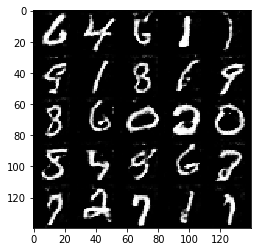

Epoch 2/2... Discriminator Loss: 0.9541... Generator Loss: 1.9001
Epoch 2/2... Discriminator Loss: 1.3105... Generator Loss: 0.5070
Epoch 2/2... Discriminator Loss: 0.9452... Generator Loss: 1.2133
Epoch 2/2... Discriminator Loss: 1.2634... Generator Loss: 0.6035
Epoch 2/2... Discriminator Loss: 0.9708... Generator Loss: 1.0232
Epoch 2/2... Discriminator Loss: 0.9019... Generator Loss: 0.9153
Epoch 2/2... Discriminator Loss: 1.5284... Generator Loss: 0.4019
Epoch 2/2... Discriminator Loss: 0.7111... Generator Loss: 1.9983
Epoch 2/2... Discriminator Loss: 1.0372... Generator Loss: 0.7936
Epoch 2/2... Discriminator Loss: 1.3979... Generator Loss: 0.5481


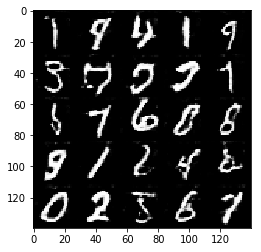

Epoch 2/2... Discriminator Loss: 1.6371... Generator Loss: 0.3484
Epoch 2/2... Discriminator Loss: 1.2308... Generator Loss: 2.3193
Epoch 2/2... Discriminator Loss: 0.9811... Generator Loss: 0.8967
Epoch 2/2... Discriminator Loss: 0.4913... Generator Loss: 1.9925
Epoch 2/2... Discriminator Loss: 0.9145... Generator Loss: 2.2686
Epoch 2/2... Discriminator Loss: 1.7393... Generator Loss: 0.3210
Epoch 2/2... Discriminator Loss: 0.8822... Generator Loss: 0.9768
Epoch 2/2... Discriminator Loss: 0.9231... Generator Loss: 0.8650
Epoch 2/2... Discriminator Loss: 0.8998... Generator Loss: 0.9074
Epoch 2/2... Discriminator Loss: 1.4212... Generator Loss: 0.4749


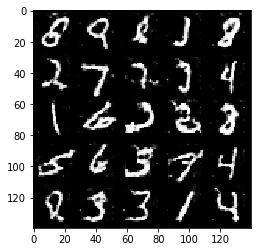

Epoch 2/2... Discriminator Loss: 1.3431... Generator Loss: 0.5392
Epoch 2/2... Discriminator Loss: 1.2415... Generator Loss: 0.6289
Epoch 2/2... Discriminator Loss: 0.7834... Generator Loss: 1.4455
Epoch 2/2... Discriminator Loss: 1.0014... Generator Loss: 1.2004
Epoch 2/2... Discriminator Loss: 1.0490... Generator Loss: 0.7508
Epoch 2/2... Discriminator Loss: 1.1964... Generator Loss: 0.6508
Epoch 2/2... Discriminator Loss: 1.0501... Generator Loss: 0.7644
Epoch 2/2... Discriminator Loss: 1.1530... Generator Loss: 0.6578
Epoch 2/2... Discriminator Loss: 1.8608... Generator Loss: 0.2747
Epoch 2/2... Discriminator Loss: 0.9331... Generator Loss: 1.0048


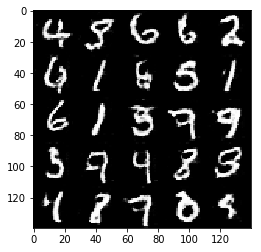

Epoch 2/2... Discriminator Loss: 1.6379... Generator Loss: 0.3740
Epoch 2/2... Discriminator Loss: 0.7495... Generator Loss: 1.6993
Epoch 2/2... Discriminator Loss: 1.7497... Generator Loss: 0.3154
Epoch 2/2... Discriminator Loss: 1.0396... Generator Loss: 1.1825
Epoch 2/2... Discriminator Loss: 1.0902... Generator Loss: 2.4946
Epoch 2/2... Discriminator Loss: 1.1906... Generator Loss: 0.6103
Epoch 2/2... Discriminator Loss: 1.1879... Generator Loss: 1.5832
Epoch 2/2... Discriminator Loss: 1.0320... Generator Loss: 0.8645
Epoch 2/2... Discriminator Loss: 1.2855... Generator Loss: 0.5536
Epoch 2/2... Discriminator Loss: 0.7907... Generator Loss: 1.0907


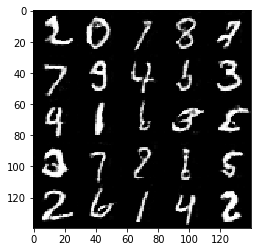

Epoch 2/2... Discriminator Loss: 0.7200... Generator Loss: 1.3067
Epoch 2/2... Discriminator Loss: 0.7682... Generator Loss: 1.3395
Epoch 2/2... Discriminator Loss: 1.9900... Generator Loss: 0.2315
Epoch 2/2... Discriminator Loss: 0.6755... Generator Loss: 1.4429
Epoch 2/2... Discriminator Loss: 0.8715... Generator Loss: 1.1352
Epoch 2/2... Discriminator Loss: 0.7486... Generator Loss: 2.1370
Epoch 2/2... Discriminator Loss: 0.9665... Generator Loss: 0.8164
Epoch 2/2... Discriminator Loss: 0.8135... Generator Loss: 1.2987
Epoch 2/2... Discriminator Loss: 0.7082... Generator Loss: 1.4447
Epoch 2/2... Discriminator Loss: 0.8853... Generator Loss: 0.9684


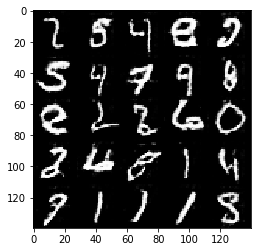

Epoch 2/2... Discriminator Loss: 0.9067... Generator Loss: 1.2759
Epoch 2/2... Discriminator Loss: 1.0850... Generator Loss: 0.6883
Epoch 2/2... Discriminator Loss: 0.9826... Generator Loss: 1.3664
Epoch 2/2... Discriminator Loss: 0.7817... Generator Loss: 1.3379
Epoch 2/2... Discriminator Loss: 1.3663... Generator Loss: 0.4591
Epoch 2/2... Discriminator Loss: 1.1233... Generator Loss: 0.6950
Epoch 2/2... Discriminator Loss: 0.8995... Generator Loss: 0.9044
Epoch 2/2... Discriminator Loss: 0.6941... Generator Loss: 1.4106
Epoch 2/2... Discriminator Loss: 1.1254... Generator Loss: 1.9753
Epoch 2/2... Discriminator Loss: 1.3482... Generator Loss: 1.5592


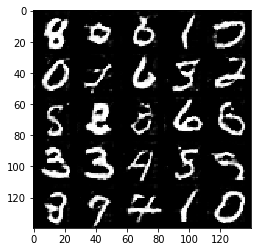

Epoch 2/2... Discriminator Loss: 1.1394... Generator Loss: 0.6413
Epoch 2/2... Discriminator Loss: 0.7146... Generator Loss: 1.5192
Epoch 2/2... Discriminator Loss: 0.9111... Generator Loss: 0.9053
Epoch 2/2... Discriminator Loss: 0.7049... Generator Loss: 1.3800
Epoch 2/2... Discriminator Loss: 1.2404... Generator Loss: 0.5518
Epoch 2/2... Discriminator Loss: 0.8814... Generator Loss: 1.0138
Epoch 2/2... Discriminator Loss: 1.5028... Generator Loss: 0.4228
Epoch 2/2... Discriminator Loss: 0.8236... Generator Loss: 1.1653
Epoch 2/2... Discriminator Loss: 1.2487... Generator Loss: 0.5642
Epoch 2/2... Discriminator Loss: 0.9595... Generator Loss: 0.8263


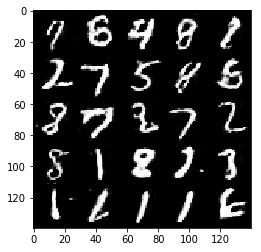

Epoch 2/2... Discriminator Loss: 1.2566... Generator Loss: 0.5701
Epoch 2/2... Discriminator Loss: 0.7987... Generator Loss: 1.0572
Epoch 2/2... Discriminator Loss: 0.6837... Generator Loss: 1.3638
Epoch 2/2... Discriminator Loss: 0.9390... Generator Loss: 0.9411
Epoch 2/2... Discriminator Loss: 1.5185... Generator Loss: 0.4085
Epoch 2/2... Discriminator Loss: 1.2400... Generator Loss: 0.5699
Epoch 2/2... Discriminator Loss: 1.3820... Generator Loss: 0.4867
Epoch 2/2... Discriminator Loss: 1.6646... Generator Loss: 0.3696
Epoch 2/2... Discriminator Loss: 2.0087... Generator Loss: 0.2413
Epoch 2/2... Discriminator Loss: 0.8605... Generator Loss: 1.0395


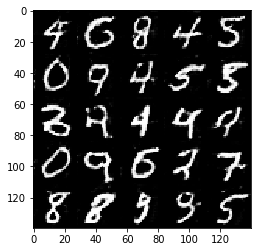

Epoch 2/2... Discriminator Loss: 1.2570... Generator Loss: 0.5526
Epoch 2/2... Discriminator Loss: 1.9284... Generator Loss: 0.2661
Epoch 2/2... Discriminator Loss: 1.1788... Generator Loss: 0.6823
Epoch 2/2... Discriminator Loss: 2.2735... Generator Loss: 0.2110
Epoch 2/2... Discriminator Loss: 0.8959... Generator Loss: 0.9503
Epoch 2/2... Discriminator Loss: 1.5388... Generator Loss: 0.3991
Epoch 2/2... Discriminator Loss: 0.6754... Generator Loss: 1.4091
Epoch 2/2... Discriminator Loss: 1.0689... Generator Loss: 0.7978
Epoch 2/2... Discriminator Loss: 1.0671... Generator Loss: 0.9422
Epoch 2/2... Discriminator Loss: 1.1628... Generator Loss: 0.6262


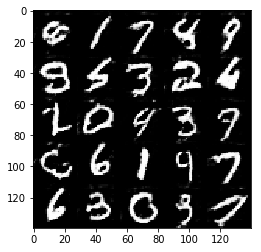

Epoch 2/2... Discriminator Loss: 1.0349... Generator Loss: 0.8112
Epoch 2/2... Discriminator Loss: 1.5456... Generator Loss: 0.3835
Epoch 2/2... Discriminator Loss: 0.8375... Generator Loss: 1.2538
Epoch 2/2... Discriminator Loss: 0.7228... Generator Loss: 1.2258
Epoch 2/2... Discriminator Loss: 1.8325... Generator Loss: 0.3016
Epoch 2/2... Discriminator Loss: 0.7279... Generator Loss: 1.3370
Epoch 2/2... Discriminator Loss: 1.3937... Generator Loss: 0.5206
Epoch 2/2... Discriminator Loss: 0.8332... Generator Loss: 1.0318
Epoch 2/2... Discriminator Loss: 1.0190... Generator Loss: 1.2208
Epoch 2/2... Discriminator Loss: 0.7145... Generator Loss: 1.2839


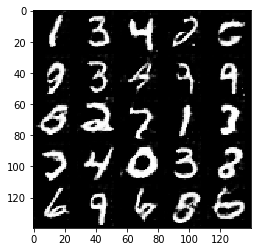

Epoch 2/2... Discriminator Loss: 1.7050... Generator Loss: 0.3302
Epoch 2/2... Discriminator Loss: 1.0356... Generator Loss: 1.0396
Epoch 2/2... Discriminator Loss: 1.0763... Generator Loss: 0.6966
Epoch 2/2... Discriminator Loss: 1.4743... Generator Loss: 0.4530
Epoch 2/2... Discriminator Loss: 1.8102... Generator Loss: 0.2866
Epoch 2/2... Discriminator Loss: 0.8681... Generator Loss: 1.6984
Epoch 2/2... Discriminator Loss: 0.6860... Generator Loss: 1.6767
Epoch 2/2... Discriminator Loss: 0.9839... Generator Loss: 0.8391
Epoch 2/2... Discriminator Loss: 0.9587... Generator Loss: 0.8658
Epoch 2/2... Discriminator Loss: 1.4060... Generator Loss: 0.4694


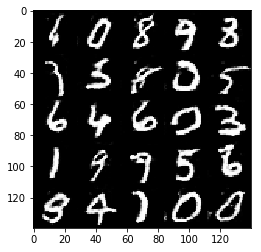

Epoch 2/2... Discriminator Loss: 0.6854... Generator Loss: 1.6633
Epoch 2/2... Discriminator Loss: 0.8566... Generator Loss: 2.6580
Epoch 2/2... Discriminator Loss: 1.6190... Generator Loss: 0.3952
Epoch 2/2... Discriminator Loss: 0.8937... Generator Loss: 0.9305
Epoch 2/2... Discriminator Loss: 0.8446... Generator Loss: 1.2869
Epoch 2/2... Discriminator Loss: 0.9421... Generator Loss: 0.9915
Epoch 2/2... Discriminator Loss: 0.7938... Generator Loss: 1.1099
Epoch 2/2... Discriminator Loss: 1.0226... Generator Loss: 0.8033
Epoch 2/2... Discriminator Loss: 0.8634... Generator Loss: 0.9743
Epoch 2/2... Discriminator Loss: 1.0200... Generator Loss: 0.7833


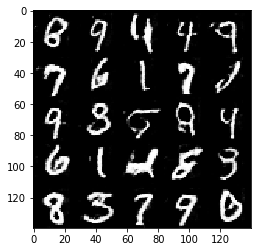

In [ ]:
# 在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.9530... Generator Loss: 3.9976
Epoch 1/1... Discriminator Loss: 0.4255... Generator Loss: 3.3312
Epoch 1/1... Discriminator Loss: 1.6030... Generator Loss: 0.3921
Epoch 1/1... Discriminator Loss: 2.7084... Generator Loss: 0.1576
Epoch 1/1... Discriminator Loss: 0.6588... Generator Loss: 3.3965
Epoch 1/1... Discriminator Loss: 0.5378... Generator Loss: 1.9692
Epoch 1/1... Discriminator Loss: 0.5700... Generator Loss: 2.1052
Epoch 1/1... Discriminator Loss: 0.8291... Generator Loss: 1.5213
Epoch 1/1... Discriminator Loss: 1.1493... Generator Loss: 1.1376
Epoch 1/1... Discriminator Loss: 1.5808... Generator Loss: 0.6304


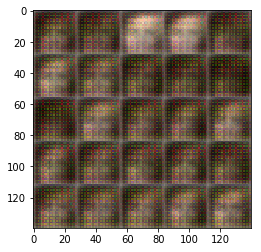

Epoch 1/1... Discriminator Loss: 0.8846... Generator Loss: 1.3351
Epoch 1/1... Discriminator Loss: 1.5003... Generator Loss: 0.5639
Epoch 1/1... Discriminator Loss: 0.9851... Generator Loss: 1.3557
Epoch 1/1... Discriminator Loss: 0.6628... Generator Loss: 1.7563
Epoch 1/1... Discriminator Loss: 2.2342... Generator Loss: 0.2647
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.8101
Epoch 1/1... Discriminator Loss: 0.9780... Generator Loss: 1.2218
Epoch 1/1... Discriminator Loss: 0.9610... Generator Loss: 0.9463
Epoch 1/1... Discriminator Loss: 1.0774... Generator Loss: 1.4205
Epoch 1/1... Discriminator Loss: 1.0309... Generator Loss: 1.2050


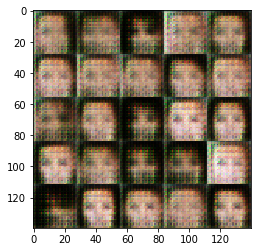

Epoch 1/1... Discriminator Loss: 1.7919... Generator Loss: 0.4675
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.5983
Epoch 1/1... Discriminator Loss: 0.9370... Generator Loss: 1.1447
Epoch 1/1... Discriminator Loss: 0.8094... Generator Loss: 1.1952
Epoch 1/1... Discriminator Loss: 0.8970... Generator Loss: 1.2368
Epoch 1/1... Discriminator Loss: 0.8837... Generator Loss: 1.1577
Epoch 1/1... Discriminator Loss: 0.9603... Generator Loss: 1.2956
Epoch 1/1... Discriminator Loss: 1.0886... Generator Loss: 1.3479
Epoch 1/1... Discriminator Loss: 1.6198... Generator Loss: 0.4557
Epoch 1/1... Discriminator Loss: 1.1817... Generator Loss: 0.8604


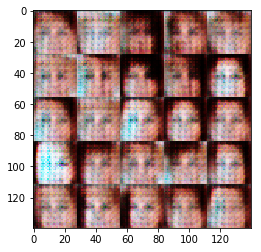

Epoch 1/1... Discriminator Loss: 1.4416... Generator Loss: 0.6270
Epoch 1/1... Discriminator Loss: 1.1102... Generator Loss: 1.0819
Epoch 1/1... Discriminator Loss: 0.8666... Generator Loss: 2.3960
Epoch 1/1... Discriminator Loss: 1.1105... Generator Loss: 0.7344
Epoch 1/1... Discriminator Loss: 1.4127... Generator Loss: 0.6809
Epoch 1/1... Discriminator Loss: 1.0312... Generator Loss: 1.0287
Epoch 1/1... Discriminator Loss: 0.9327... Generator Loss: 1.5002
Epoch 1/1... Discriminator Loss: 1.0915... Generator Loss: 1.1990
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.6369
Epoch 1/1... Discriminator Loss: 0.9064... Generator Loss: 1.1540


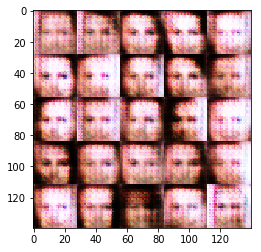

Epoch 1/1... Discriminator Loss: 0.9457... Generator Loss: 0.9712
Epoch 1/1... Discriminator Loss: 1.3595... Generator Loss: 0.6356
Epoch 1/1... Discriminator Loss: 1.1856... Generator Loss: 2.1173
Epoch 1/1... Discriminator Loss: 0.8029... Generator Loss: 1.5227
Epoch 1/1... Discriminator Loss: 1.6062... Generator Loss: 0.4455
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.6662
Epoch 1/1... Discriminator Loss: 1.1183... Generator Loss: 0.9656
Epoch 1/1... Discriminator Loss: 1.0511... Generator Loss: 0.9647
Epoch 1/1... Discriminator Loss: 1.3894... Generator Loss: 0.6749
Epoch 1/1... Discriminator Loss: 0.7383... Generator Loss: 1.7505


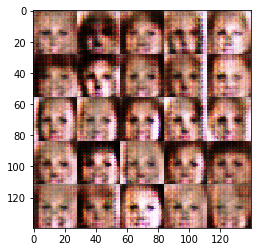

Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.9306
Epoch 1/1... Discriminator Loss: 0.9959... Generator Loss: 0.9800
Epoch 1/1... Discriminator Loss: 1.2510... Generator Loss: 0.6382
Epoch 1/1... Discriminator Loss: 1.0550... Generator Loss: 1.0248
Epoch 1/1... Discriminator Loss: 1.0478... Generator Loss: 1.3078
Epoch 1/1... Discriminator Loss: 1.0282... Generator Loss: 1.0748
Epoch 1/1... Discriminator Loss: 0.8715... Generator Loss: 1.3103
Epoch 1/1... Discriminator Loss: 1.1205... Generator Loss: 0.7538
Epoch 1/1... Discriminator Loss: 1.0009... Generator Loss: 1.0035
Epoch 1/1... Discriminator Loss: 0.9238... Generator Loss: 1.7412


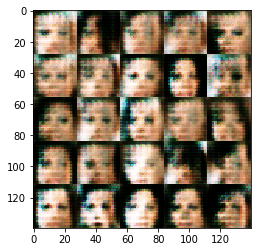

Epoch 1/1... Discriminator Loss: 0.9439... Generator Loss: 1.4717
Epoch 1/1... Discriminator Loss: 1.4076... Generator Loss: 0.5343
Epoch 1/1... Discriminator Loss: 1.6314... Generator Loss: 0.3795
Epoch 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.0558... Generator Loss: 0.9203
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 1.1328
Epoch 1/1... Discriminator Loss: 0.9423... Generator Loss: 1.0505
Epoch 1/1... Discriminator Loss: 1.2162... Generator Loss: 0.8679
Epoch 1/1... Discriminator Loss: 1.0741... Generator Loss: 0.9512
Epoch 1/1... Discriminator Loss: 1.1018... Generator Loss: 0.8207


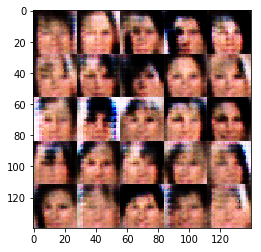

Epoch 1/1... Discriminator Loss: 1.4300... Generator Loss: 0.5774
Epoch 1/1... Discriminator Loss: 0.9869... Generator Loss: 0.9725
Epoch 1/1... Discriminator Loss: 0.7398... Generator Loss: 1.3676
Epoch 1/1... Discriminator Loss: 2.1522... Generator Loss: 0.2013
Epoch 1/1... Discriminator Loss: 0.9207... Generator Loss: 1.1745
Epoch 1/1... Discriminator Loss: 0.8843... Generator Loss: 1.1353
Epoch 1/1... Discriminator Loss: 0.9521... Generator Loss: 0.9763
Epoch 1/1... Discriminator Loss: 1.0856... Generator Loss: 1.1658
Epoch 1/1... Discriminator Loss: 0.7750... Generator Loss: 1.3986
Epoch 1/1... Discriminator Loss: 1.5781... Generator Loss: 0.3953


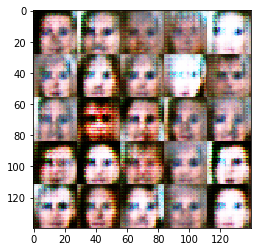

Epoch 1/1... Discriminator Loss: 1.1176... Generator Loss: 0.9418
Epoch 1/1... Discriminator Loss: 0.9850... Generator Loss: 1.2278
Epoch 1/1... Discriminator Loss: 0.9995... Generator Loss: 1.1964
Epoch 1/1... Discriminator Loss: 0.9129... Generator Loss: 1.2382
Epoch 1/1... Discriminator Loss: 0.7927... Generator Loss: 1.9148
Epoch 1/1... Discriminator Loss: 0.9689... Generator Loss: 0.9142
Epoch 1/1... Discriminator Loss: 1.2500... Generator Loss: 0.7719
Epoch 1/1... Discriminator Loss: 1.1215... Generator Loss: 0.9722
Epoch 1/1... Discriminator Loss: 0.9696... Generator Loss: 0.9703
Epoch 1/1... Discriminator Loss: 0.9033... Generator Loss: 0.9863


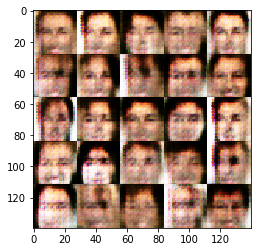

Epoch 1/1... Discriminator Loss: 1.1579... Generator Loss: 0.8948
Epoch 1/1... Discriminator Loss: 1.0523... Generator Loss: 1.0702
Epoch 1/1... Discriminator Loss: 0.7958... Generator Loss: 1.2694
Epoch 1/1... Discriminator Loss: 0.7918... Generator Loss: 1.2223
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 0.5551
Epoch 1/1... Discriminator Loss: 0.7780... Generator Loss: 1.5046
Epoch 1/1... Discriminator Loss: 0.7581... Generator Loss: 1.7413
Epoch 1/1... Discriminator Loss: 1.1882... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.0833... Generator Loss: 1.4467
Epoch 1/1... Discriminator Loss: 1.1443... Generator Loss: 0.6648


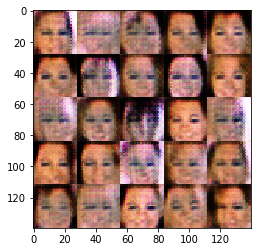

Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.6772
Epoch 1/1... Discriminator Loss: 0.8026... Generator Loss: 1.2577
Epoch 1/1... Discriminator Loss: 0.9446... Generator Loss: 0.9550
Epoch 1/1... Discriminator Loss: 1.0008... Generator Loss: 0.9348
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.5674
Epoch 1/1... Discriminator Loss: 1.2851... Generator Loss: 0.6917
Epoch 1/1... Discriminator Loss: 1.0607... Generator Loss: 1.9662
Epoch 1/1... Discriminator Loss: 0.9719... Generator Loss: 0.9177
Epoch 1/1... Discriminator Loss: 1.4554... Generator Loss: 0.5316
Epoch 1/1... Discriminator Loss: 1.4506... Generator Loss: 0.4869


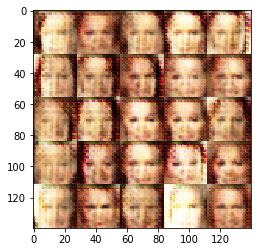

Epoch 1/1... Discriminator Loss: 0.7361... Generator Loss: 2.1431
Epoch 1/1... Discriminator Loss: 0.6947... Generator Loss: 1.4425
Epoch 1/1... Discriminator Loss: 1.0218... Generator Loss: 0.9360
Epoch 1/1... Discriminator Loss: 1.6192... Generator Loss: 0.7193
Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 0.8365... Generator Loss: 1.4146
Epoch 1/1... Discriminator Loss: 0.8404... Generator Loss: 1.4822
Epoch 1/1... Discriminator Loss: 1.1674... Generator Loss: 0.7161
Epoch 1/1... Discriminator Loss: 0.8204... Generator Loss: 1.6293
Epoch 1/1... Discriminator Loss: 1.0200... Generator Loss: 0.8116


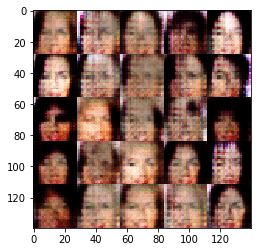

Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.5586
Epoch 1/1... Discriminator Loss: 0.9881... Generator Loss: 1.2410
Epoch 1/1... Discriminator Loss: 1.0814... Generator Loss: 1.1150
Epoch 1/1... Discriminator Loss: 1.4868... Generator Loss: 0.4838
Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 2.2412
Epoch 1/1... Discriminator Loss: 1.2685... Generator Loss: 0.5991
Epoch 1/1... Discriminator Loss: 1.0726... Generator Loss: 1.1415
Epoch 1/1... Discriminator Loss: 2.6391... Generator Loss: 0.1229
Epoch 1/1... Discriminator Loss: 1.0039... Generator Loss: 1.0032
Epoch 1/1... Discriminator Loss: 1.5917... Generator Loss: 0.3734


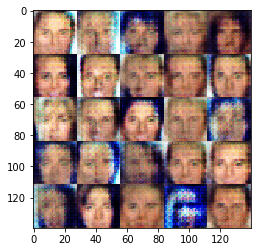

Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.7932
Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 1.7581
Epoch 1/1... Discriminator Loss: 1.0681... Generator Loss: 1.2227
Epoch 1/1... Discriminator Loss: 1.1127... Generator Loss: 0.7278
Epoch 1/1... Discriminator Loss: 1.3824... Generator Loss: 0.5452
Epoch 1/1... Discriminator Loss: 0.9855... Generator Loss: 0.9891
Epoch 1/1... Discriminator Loss: 0.9459... Generator Loss: 1.1456
Epoch 1/1... Discriminator Loss: 1.1080... Generator Loss: 0.7087
Epoch 1/1... Discriminator Loss: 1.4670... Generator Loss: 0.4484
Epoch 1/1... Discriminator Loss: 1.2210... Generator Loss: 0.6501


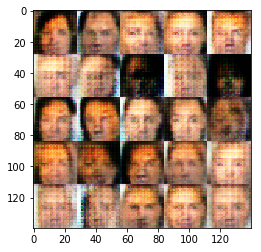

Epoch 1/1... Discriminator Loss: 1.0017... Generator Loss: 1.0151
Epoch 1/1... Discriminator Loss: 1.2208... Generator Loss: 0.7107
Epoch 1/1... Discriminator Loss: 1.0567... Generator Loss: 0.8871
Epoch 1/1... Discriminator Loss: 0.8628... Generator Loss: 1.1703
Epoch 1/1... Discriminator Loss: 1.2155... Generator Loss: 0.6348
Epoch 1/1... Discriminator Loss: 0.9816... Generator Loss: 0.9752
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 1.1254
Epoch 1/1... Discriminator Loss: 1.2462... Generator Loss: 1.5717
Epoch 1/1... Discriminator Loss: 1.4493... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.1396... Generator Loss: 0.8328


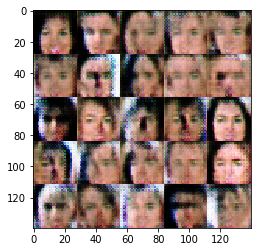

Epoch 1/1... Discriminator Loss: 0.9619... Generator Loss: 0.9395
Epoch 1/1... Discriminator Loss: 0.9760... Generator Loss: 0.8937
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.5407
Epoch 1/1... Discriminator Loss: 0.7829... Generator Loss: 1.8792
Epoch 1/1... Discriminator Loss: 0.8525... Generator Loss: 1.0935
Epoch 1/1... Discriminator Loss: 1.1182... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.5542
Epoch 1/1... Discriminator Loss: 1.5109... Generator Loss: 0.4560
Epoch 1/1... Discriminator Loss: 0.8069... Generator Loss: 1.5258
Epoch 1/1... Discriminator Loss: 0.8549... Generator Loss: 1.1900


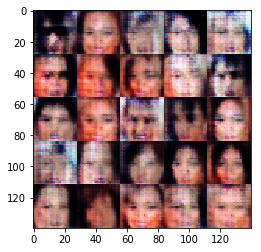

Epoch 1/1... Discriminator Loss: 0.9190... Generator Loss: 1.3781
Epoch 1/1... Discriminator Loss: 1.3025... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 0.8365... Generator Loss: 1.1990
Epoch 1/1... Discriminator Loss: 0.7329... Generator Loss: 1.4664
Epoch 1/1... Discriminator Loss: 1.1594... Generator Loss: 1.1144
Epoch 1/1... Discriminator Loss: 0.8499... Generator Loss: 1.1573
Epoch 1/1... Discriminator Loss: 0.7934... Generator Loss: 1.7749
Epoch 1/1... Discriminator Loss: 0.9424... Generator Loss: 1.0012
Epoch 1/1... Discriminator Loss: 1.4698... Generator Loss: 0.4488
Epoch 1/1... Discriminator Loss: 0.7719... Generator Loss: 1.1410


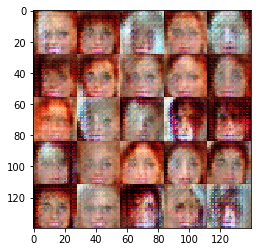

Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 0.7952
Epoch 1/1... Discriminator Loss: 1.0488... Generator Loss: 1.3721
Epoch 1/1... Discriminator Loss: 1.1242... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.0123... Generator Loss: 0.8039
Epoch 1/1... Discriminator Loss: 0.9606... Generator Loss: 1.1055
Epoch 1/1... Discriminator Loss: 0.9741... Generator Loss: 1.2641
Epoch 1/1... Discriminator Loss: 1.5305... Generator Loss: 0.4378
Epoch 1/1... Discriminator Loss: 1.7823... Generator Loss: 0.3023
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.5196
Epoch 1/1... Discriminator Loss: 1.1290... Generator Loss: 2.0072


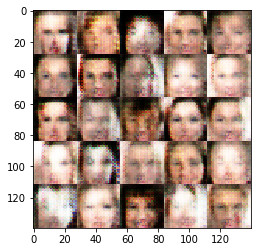

Epoch 1/1... Discriminator Loss: 1.0429... Generator Loss: 0.8391
Epoch 1/1... Discriminator Loss: 1.2265... Generator Loss: 0.5825
Epoch 1/1... Discriminator Loss: 0.7125... Generator Loss: 1.3798
Epoch 1/1... Discriminator Loss: 0.7372... Generator Loss: 1.3173
Epoch 1/1... Discriminator Loss: 1.1822... Generator Loss: 0.9326
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.8359
Epoch 1/1... Discriminator Loss: 0.9926... Generator Loss: 1.0897
Epoch 1/1... Discriminator Loss: 0.6343... Generator Loss: 1.7318
Epoch 1/1... Discriminator Loss: 0.9462... Generator Loss: 1.7082
Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 1.5509


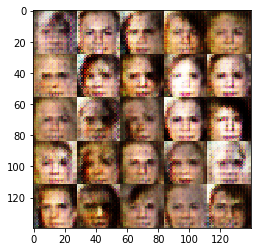

Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.4807
Epoch 1/1... Discriminator Loss: 0.8520... Generator Loss: 1.4867
Epoch 1/1... Discriminator Loss: 0.8949... Generator Loss: 1.3274
Epoch 1/1... Discriminator Loss: 1.0521... Generator Loss: 1.0841
Epoch 1/1... Discriminator Loss: 0.8981... Generator Loss: 1.2074
Epoch 1/1... Discriminator Loss: 1.0400... Generator Loss: 0.8934
Epoch 1/1... Discriminator Loss: 0.9655... Generator Loss: 1.2864
Epoch 1/1... Discriminator Loss: 0.9689... Generator Loss: 0.9077
Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.5398
Epoch 1/1... Discriminator Loss: 0.9553... Generator Loss: 1.1394


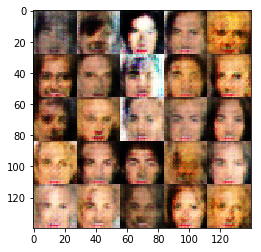

Epoch 1/1... Discriminator Loss: 1.2787... Generator Loss: 0.6458
Epoch 1/1... Discriminator Loss: 0.9934... Generator Loss: 1.0983
Epoch 1/1... Discriminator Loss: 0.8035... Generator Loss: 1.4838
Epoch 1/1... Discriminator Loss: 1.0839... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.0201... Generator Loss: 1.1645
Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.5053
Epoch 1/1... Discriminator Loss: 0.9444... Generator Loss: 1.2501
Epoch 1/1... Discriminator Loss: 0.8030... Generator Loss: 1.1774
Epoch 1/1... Discriminator Loss: 1.1136... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.1236... Generator Loss: 0.7017


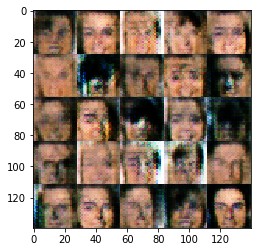

Epoch 1/1... Discriminator Loss: 0.7865... Generator Loss: 1.2627
Epoch 1/1... Discriminator Loss: 0.7689... Generator Loss: 1.3919
Epoch 1/1... Discriminator Loss: 1.1038... Generator Loss: 0.8308
Epoch 1/1... Discriminator Loss: 0.8484... Generator Loss: 1.2766
Epoch 1/1... Discriminator Loss: 0.7876... Generator Loss: 1.3606
Epoch 1/1... Discriminator Loss: 0.9495... Generator Loss: 0.8880
Epoch 1/1... Discriminator Loss: 0.9908... Generator Loss: 0.9674
Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 0.6506
Epoch 1/1... Discriminator Loss: 1.0278... Generator Loss: 0.8256
Epoch 1/1... Discriminator Loss: 1.0647... Generator Loss: 1.4054


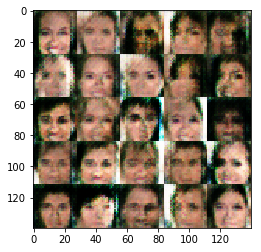

Epoch 1/1... Discriminator Loss: 0.9832... Generator Loss: 0.8447
Epoch 1/1... Discriminator Loss: 1.0470... Generator Loss: 0.8448
Epoch 1/1... Discriminator Loss: 0.8733... Generator Loss: 1.4203
Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 0.7176
Epoch 1/1... Discriminator Loss: 1.3619... Generator Loss: 0.6450
Epoch 1/1... Discriminator Loss: 0.8967... Generator Loss: 1.0001
Epoch 1/1... Discriminator Loss: 0.9752... Generator Loss: 1.2439
Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.5037
Epoch 1/1... Discriminator Loss: 1.1877... Generator Loss: 0.7812
Epoch 1/1... Discriminator Loss: 0.9051... Generator Loss: 1.1184


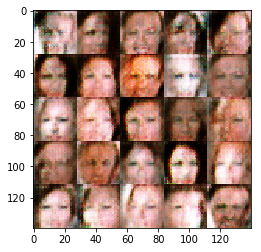

Epoch 1/1... Discriminator Loss: 1.0053... Generator Loss: 1.0875
Epoch 1/1... Discriminator Loss: 1.3289... Generator Loss: 0.6107
Epoch 1/1... Discriminator Loss: 1.0307... Generator Loss: 0.7828
Epoch 1/1... Discriminator Loss: 0.7107... Generator Loss: 2.3445
Epoch 1/1... Discriminator Loss: 0.8665... Generator Loss: 1.0089
Epoch 1/1... Discriminator Loss: 0.7882... Generator Loss: 1.3722
Epoch 1/1... Discriminator Loss: 1.7067... Generator Loss: 0.3798
Epoch 1/1... Discriminator Loss: 0.8739... Generator Loss: 1.1552
Epoch 1/1... Discriminator Loss: 1.1830... Generator Loss: 0.6449
Epoch 1/1... Discriminator Loss: 1.1111... Generator Loss: 0.7863


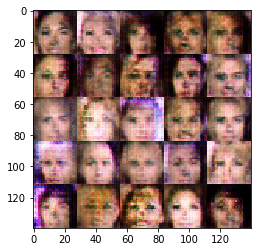

Epoch 1/1... Discriminator Loss: 0.9193... Generator Loss: 1.1636
Epoch 1/1... Discriminator Loss: 1.2045... Generator Loss: 0.6077
Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.5884
Epoch 1/1... Discriminator Loss: 1.1997... Generator Loss: 0.6685
Epoch 1/1... Discriminator Loss: 1.1613... Generator Loss: 0.9194
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 1.0668... Generator Loss: 1.1445
Epoch 1/1... Discriminator Loss: 0.9501... Generator Loss: 1.0403
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.5198
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.5156


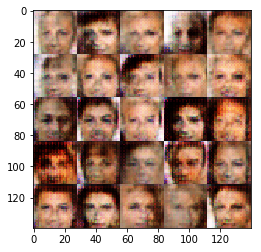

Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6392
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.6510
Epoch 1/1... Discriminator Loss: 1.1103... Generator Loss: 0.8944
Epoch 1/1... Discriminator Loss: 0.9168... Generator Loss: 1.0269
Epoch 1/1... Discriminator Loss: 1.2022... Generator Loss: 0.6108
Epoch 1/1... Discriminator Loss: 0.9436... Generator Loss: 1.0379
Epoch 1/1... Discriminator Loss: 0.9913... Generator Loss: 0.8989
Epoch 1/1... Discriminator Loss: 0.8384... Generator Loss: 1.5018
Epoch 1/1... Discriminator Loss: 1.2652... Generator Loss: 0.6425
Epoch 1/1... Discriminator Loss: 1.1618... Generator Loss: 0.7393


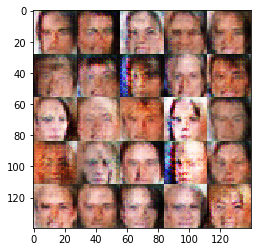

Epoch 1/1... Discriminator Loss: 0.8803... Generator Loss: 1.2038
Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 0.7478
Epoch 1/1... Discriminator Loss: 1.5241... Generator Loss: 0.4647
Epoch 1/1... Discriminator Loss: 0.9199... Generator Loss: 1.0323
Epoch 1/1... Discriminator Loss: 1.4447... Generator Loss: 0.4808
Epoch 1/1... Discriminator Loss: 1.0691... Generator Loss: 1.2249
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.1811... Generator Loss: 1.0478
Epoch 1/1... Discriminator Loss: 0.8220... Generator Loss: 1.5769
Epoch 1/1... Discriminator Loss: 1.1653... Generator Loss: 0.8563


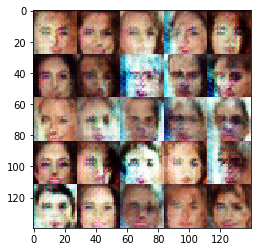

Epoch 1/1... Discriminator Loss: 0.9169... Generator Loss: 0.9955
Epoch 1/1... Discriminator Loss: 0.8982... Generator Loss: 1.1792
Epoch 1/1... Discriminator Loss: 1.2339... Generator Loss: 0.6044
Epoch 1/1... Discriminator Loss: 1.1491... Generator Loss: 0.7597
Epoch 1/1... Discriminator Loss: 1.0708... Generator Loss: 0.7700
Epoch 1/1... Discriminator Loss: 1.1509... Generator Loss: 0.8518
Epoch 1/1... Discriminator Loss: 0.9607... Generator Loss: 1.6855
Epoch 1/1... Discriminator Loss: 1.2516... Generator Loss: 0.5766
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.6285
Epoch 1/1... Discriminator Loss: 0.8228... Generator Loss: 1.4827


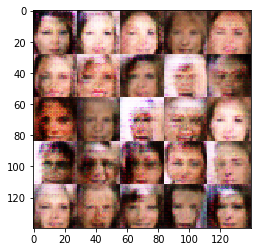

Epoch 1/1... Discriminator Loss: 0.9916... Generator Loss: 0.8213
Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.4902
Epoch 1/1... Discriminator Loss: 1.2086... Generator Loss: 0.6556
Epoch 1/1... Discriminator Loss: 0.9218... Generator Loss: 1.0522
Epoch 1/1... Discriminator Loss: 0.9313... Generator Loss: 1.1692
Epoch 1/1... Discriminator Loss: 0.7630... Generator Loss: 1.2303
Epoch 1/1... Discriminator Loss: 1.3310... Generator Loss: 0.5054
Epoch 1/1... Discriminator Loss: 0.9906... Generator Loss: 1.3133
Epoch 1/1... Discriminator Loss: 1.0118... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 1.0309... Generator Loss: 1.1234


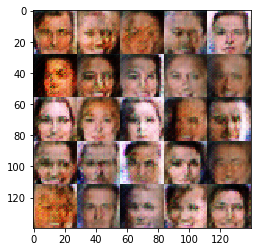

Epoch 1/1... Discriminator Loss: 1.1332... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 1.0776... Generator Loss: 0.8923
Epoch 1/1... Discriminator Loss: 1.1142... Generator Loss: 0.9490
Epoch 1/1... Discriminator Loss: 0.9441... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 1.0587... Generator Loss: 0.9474
Epoch 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.5121
Epoch 1/1... Discriminator Loss: 0.8585... Generator Loss: 1.1075
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 0.8198
Epoch 1/1... Discriminator Loss: 0.8977... Generator Loss: 1.6129
Epoch 1/1... Discriminator Loss: 0.9940... Generator Loss: 1.2558


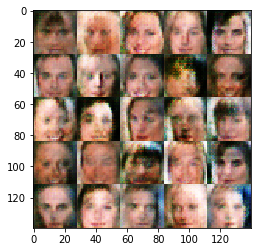

Epoch 1/1... Discriminator Loss: 1.1776... Generator Loss: 0.6883
Epoch 1/1... Discriminator Loss: 1.0475... Generator Loss: 1.0022
Epoch 1/1... Discriminator Loss: 0.8864... Generator Loss: 1.2846
Epoch 1/1... Discriminator Loss: 1.0665... Generator Loss: 0.9439
Epoch 1/1... Discriminator Loss: 0.9531... Generator Loss: 1.0710
Epoch 1/1... Discriminator Loss: 1.0836... Generator Loss: 0.7117
Epoch 1/1... Discriminator Loss: 1.2223... Generator Loss: 0.5922
Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 0.8464... Generator Loss: 1.1539
Epoch 1/1... Discriminator Loss: 1.0495... Generator Loss: 0.9580


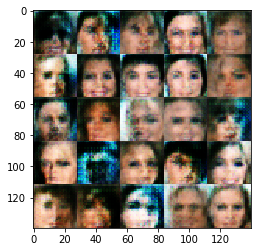

Epoch 1/1... Discriminator Loss: 1.0575... Generator Loss: 0.7988
Epoch 1/1... Discriminator Loss: 1.1017... Generator Loss: 0.7985
Epoch 1/1... Discriminator Loss: 1.1014... Generator Loss: 0.8501
Epoch 1/1... Discriminator Loss: 1.1366... Generator Loss: 0.7684
Epoch 1/1... Discriminator Loss: 1.2136... Generator Loss: 0.6289
Epoch 1/1... Discriminator Loss: 0.8445... Generator Loss: 1.3653
Epoch 1/1... Discriminator Loss: 0.9401... Generator Loss: 0.9860
Epoch 1/1... Discriminator Loss: 1.2423... Generator Loss: 0.7660
Epoch 1/1... Discriminator Loss: 0.8901... Generator Loss: 1.0159
Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 2.1960


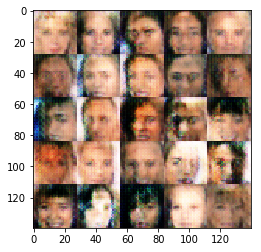

Epoch 1/1... Discriminator Loss: 1.0526... Generator Loss: 1.0868
Epoch 1/1... Discriminator Loss: 0.7710... Generator Loss: 1.2817
Epoch 1/1... Discriminator Loss: 0.9029... Generator Loss: 1.1733
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 0.5595
Epoch 1/1... Discriminator Loss: 1.0628... Generator Loss: 1.0807
Epoch 1/1... Discriminator Loss: 1.1366... Generator Loss: 0.6905
Epoch 1/1... Discriminator Loss: 1.2541... Generator Loss: 0.5966
Epoch 1/1... Discriminator Loss: 0.8961... Generator Loss: 1.1480
Epoch 1/1... Discriminator Loss: 0.9658... Generator Loss: 0.9616
Epoch 1/1... Discriminator Loss: 1.2619... Generator Loss: 0.6804


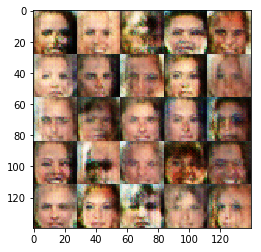

Epoch 1/1... Discriminator Loss: 0.9532... Generator Loss: 1.7080
Epoch 1/1... Discriminator Loss: 0.9263... Generator Loss: 0.9015
Epoch 1/1... Discriminator Loss: 1.2566... Generator Loss: 0.6072
Epoch 1/1... Discriminator Loss: 1.1932... Generator Loss: 0.7768
Epoch 1/1... Discriminator Loss: 1.3127... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 0.8848... Generator Loss: 1.3965
Epoch 1/1... Discriminator Loss: 0.8856... Generator Loss: 1.1076
Epoch 1/1... Discriminator Loss: 1.1537... Generator Loss: 0.7233
Epoch 1/1... Discriminator Loss: 1.2011... Generator Loss: 0.6750
Epoch 1/1... Discriminator Loss: 1.0543... Generator Loss: 0.8458


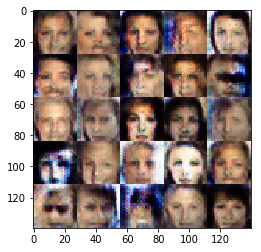

Epoch 1/1... Discriminator Loss: 1.0934... Generator Loss: 0.7847
Epoch 1/1... Discriminator Loss: 0.8681... Generator Loss: 1.0731
Epoch 1/1... Discriminator Loss: 1.2882... Generator Loss: 0.5491
Epoch 1/1... Discriminator Loss: 1.0238... Generator Loss: 0.8210
Epoch 1/1... Discriminator Loss: 0.9890... Generator Loss: 1.0181
Epoch 1/1... Discriminator Loss: 0.9889... Generator Loss: 0.9337
Epoch 1/1... Discriminator Loss: 0.9058... Generator Loss: 1.2493
Epoch 1/1... Discriminator Loss: 1.1176... Generator Loss: 0.8487
Epoch 1/1... Discriminator Loss: 1.1590... Generator Loss: 0.8214
Epoch 1/1... Discriminator Loss: 0.8787... Generator Loss: 1.3023


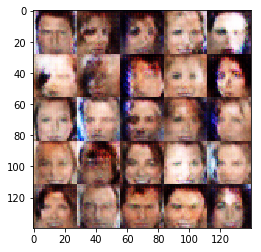

Epoch 1/1... Discriminator Loss: 0.9011... Generator Loss: 1.1935
Epoch 1/1... Discriminator Loss: 0.8938... Generator Loss: 1.1847
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.4537
Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 0.5488
Epoch 1/1... Discriminator Loss: 1.0577... Generator Loss: 0.7439
Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 0.7316
Epoch 1/1... Discriminator Loss: 1.1284... Generator Loss: 0.8817
Epoch 1/1... Discriminator Loss: 1.0457... Generator Loss: 0.9305
Epoch 1/1... Discriminator Loss: 1.1282... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 1.1990... Generator Loss: 0.6871


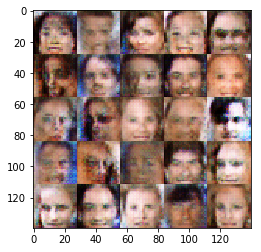

Epoch 1/1... Discriminator Loss: 1.2731... Generator Loss: 0.6043
Epoch 1/1... Discriminator Loss: 0.9809... Generator Loss: 1.1170
Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 0.7688
Epoch 1/1... Discriminator Loss: 0.9000... Generator Loss: 1.0993
Epoch 1/1... Discriminator Loss: 1.3424... Generator Loss: 1.3544
Epoch 1/1... Discriminator Loss: 1.1855... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.1592... Generator Loss: 0.9350
Epoch 1/1... Discriminator Loss: 1.1783... Generator Loss: 0.8762
Epoch 1/1... Discriminator Loss: 1.1290... Generator Loss: 0.7591
Epoch 1/1... Discriminator Loss: 1.0480... Generator Loss: 1.2326


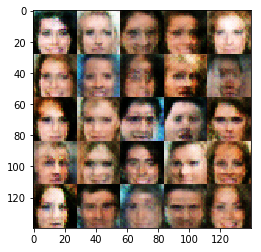

Epoch 1/1... Discriminator Loss: 1.1087... Generator Loss: 0.8503
Epoch 1/1... Discriminator Loss: 1.2050... Generator Loss: 0.7743
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.5930
Epoch 1/1... Discriminator Loss: 1.1565... Generator Loss: 0.6630
Epoch 1/1... Discriminator Loss: 1.1343... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 0.7724... Generator Loss: 1.3875
Epoch 1/1... Discriminator Loss: 1.0551... Generator Loss: 0.9335
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.5981
Epoch 1/1... Discriminator Loss: 1.0501... Generator Loss: 0.8549


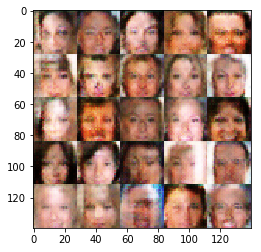

Epoch 1/1... Discriminator Loss: 1.1756... Generator Loss: 0.8171
Epoch 1/1... Discriminator Loss: 1.7964... Generator Loss: 0.3198
Epoch 1/1... Discriminator Loss: 0.8858... Generator Loss: 1.0003
Epoch 1/1... Discriminator Loss: 1.2299... Generator Loss: 0.6336
Epoch 1/1... Discriminator Loss: 0.9782... Generator Loss: 0.9531
Epoch 1/1... Discriminator Loss: 1.2311... Generator Loss: 0.7772
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 0.5158
Epoch 1/1... Discriminator Loss: 1.2469... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.0966... Generator Loss: 1.0592
Epoch 1/1... Discriminator Loss: 1.1119... Generator Loss: 0.7788


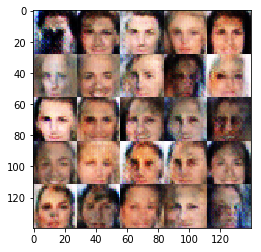

Epoch 1/1... Discriminator Loss: 1.1974... Generator Loss: 0.7631
Epoch 1/1... Discriminator Loss: 0.9640... Generator Loss: 1.0643
Epoch 1/1... Discriminator Loss: 1.0514... Generator Loss: 0.8260
Epoch 1/1... Discriminator Loss: 0.9537... Generator Loss: 0.9756
Epoch 1/1... Discriminator Loss: 1.1581... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 1.0850... Generator Loss: 0.9090
Epoch 1/1... Discriminator Loss: 0.9969... Generator Loss: 0.9652
Epoch 1/1... Discriminator Loss: 1.0598... Generator Loss: 0.7999
Epoch 1/1... Discriminator Loss: 0.9358... Generator Loss: 1.2741
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 1.5702


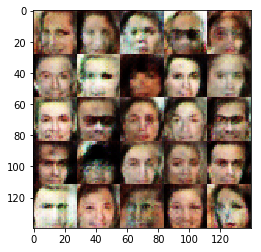

Epoch 1/1... Discriminator Loss: 1.0168... Generator Loss: 0.8886
Epoch 1/1... Discriminator Loss: 0.9533... Generator Loss: 0.9453
Epoch 1/1... Discriminator Loss: 1.2128... Generator Loss: 0.6321
Epoch 1/1... Discriminator Loss: 1.1018... Generator Loss: 0.9189
Epoch 1/1... Discriminator Loss: 1.2634... Generator Loss: 0.6210
Epoch 1/1... Discriminator Loss: 1.0949... Generator Loss: 0.8160
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.6245
Epoch 1/1... Discriminator Loss: 1.0412... Generator Loss: 0.8690
Epoch 1/1... Discriminator Loss: 1.1371... Generator Loss: 0.8458
Epoch 1/1... Discriminator Loss: 1.1144... Generator Loss: 0.7826


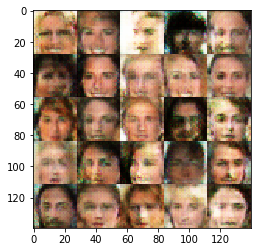

Epoch 1/1... Discriminator Loss: 0.8638... Generator Loss: 1.4758
Epoch 1/1... Discriminator Loss: 1.1137... Generator Loss: 0.8085
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.7938
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.0789... Generator Loss: 0.8989
Epoch 1/1... Discriminator Loss: 1.1151... Generator Loss: 0.7665
Epoch 1/1... Discriminator Loss: 1.2316... Generator Loss: 0.7517
Epoch 1/1... Discriminator Loss: 1.0169... Generator Loss: 0.8532
Epoch 1/1... Discriminator Loss: 0.9113... Generator Loss: 1.0403
Epoch 1/1... Discriminator Loss: 0.9387... Generator Loss: 1.1571


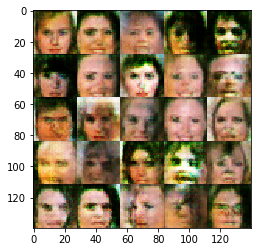

Epoch 1/1... Discriminator Loss: 1.0130... Generator Loss: 0.9137
Epoch 1/1... Discriminator Loss: 0.8273... Generator Loss: 1.1615
Epoch 1/1... Discriminator Loss: 1.0187... Generator Loss: 0.9196
Epoch 1/1... Discriminator Loss: 1.4969... Generator Loss: 0.4353
Epoch 1/1... Discriminator Loss: 1.0139... Generator Loss: 1.0999
Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 1.0111
Epoch 1/1... Discriminator Loss: 0.9798... Generator Loss: 0.9004
Epoch 1/1... Discriminator Loss: 1.2124... Generator Loss: 0.6656
Epoch 1/1... Discriminator Loss: 1.1452... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.0966... Generator Loss: 1.0406


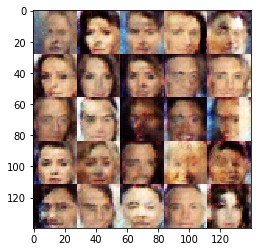

Epoch 1/1... Discriminator Loss: 1.2454... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.0762... Generator Loss: 0.8284
Epoch 1/1... Discriminator Loss: 0.9185... Generator Loss: 1.0227
Epoch 1/1... Discriminator Loss: 1.0886... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 0.8819... Generator Loss: 1.1653
Epoch 1/1... Discriminator Loss: 1.1325... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.1857... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 0.8912... Generator Loss: 1.0722
Epoch 1/1... Discriminator Loss: 1.3367... Generator Loss: 0.5599
Epoch 1/1... Discriminator Loss: 1.3873... Generator Loss: 0.6055


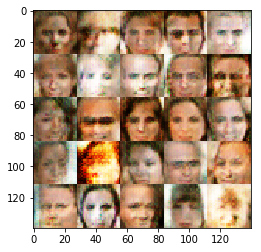

Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.7171
Epoch 1/1... Discriminator Loss: 0.9172... Generator Loss: 1.1980
Epoch 1/1... Discriminator Loss: 1.1397... Generator Loss: 1.0468
Epoch 1/1... Discriminator Loss: 1.0845... Generator Loss: 0.8806
Epoch 1/1... Discriminator Loss: 1.2560... Generator Loss: 0.6709
Epoch 1/1... Discriminator Loss: 0.9808... Generator Loss: 1.0285
Epoch 1/1... Discriminator Loss: 1.0562... Generator Loss: 0.8717
Epoch 1/1... Discriminator Loss: 1.1257... Generator Loss: 0.9729
Epoch 1/1... Discriminator Loss: 0.9012... Generator Loss: 1.2544
Epoch 1/1... Discriminator Loss: 0.8651... Generator Loss: 1.2571


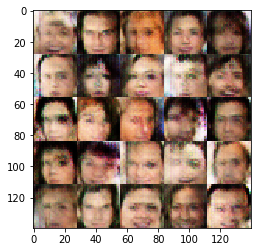

Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.1383... Generator Loss: 0.6990
Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.6077
Epoch 1/1... Discriminator Loss: 0.8017... Generator Loss: 1.5485
Epoch 1/1... Discriminator Loss: 0.8816... Generator Loss: 1.0165
Epoch 1/1... Discriminator Loss: 1.1275... Generator Loss: 0.7775
Epoch 1/1... Discriminator Loss: 0.9846... Generator Loss: 1.1062
Epoch 1/1... Discriminator Loss: 0.8937... Generator Loss: 1.0198
Epoch 1/1... Discriminator Loss: 0.9852... Generator Loss: 0.9041
Epoch 1/1... Discriminator Loss: 1.3563... Generator Loss: 0.5268


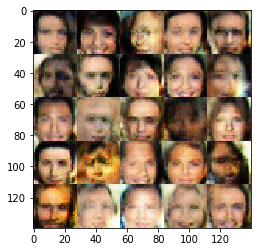

Epoch 1/1... Discriminator Loss: 0.8921... Generator Loss: 1.0124
Epoch 1/1... Discriminator Loss: 1.0117... Generator Loss: 0.9374
Epoch 1/1... Discriminator Loss: 1.0325... Generator Loss: 1.0508
Epoch 1/1... Discriminator Loss: 0.8973... Generator Loss: 1.1390
Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 1.2005... Generator Loss: 0.7614
Epoch 1/1... Discriminator Loss: 1.1770... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 0.6471
Epoch 1/1... Discriminator Loss: 1.1811... Generator Loss: 0.7444


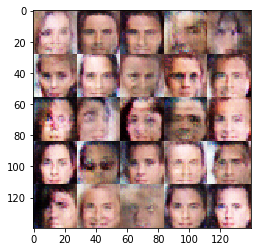

Epoch 1/1... Discriminator Loss: 1.1243... Generator Loss: 0.7504
Epoch 1/1... Discriminator Loss: 1.0537... Generator Loss: 0.9326
Epoch 1/1... Discriminator Loss: 1.2857... Generator Loss: 0.6040
Epoch 1/1... Discriminator Loss: 1.1768... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.1854... Generator Loss: 0.7259
Epoch 1/1... Discriminator Loss: 1.0112... Generator Loss: 1.0748
Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 0.7552
Epoch 1/1... Discriminator Loss: 1.1469... Generator Loss: 0.7895
Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.6138
Epoch 1/1... Discriminator Loss: 1.0101... Generator Loss: 1.0046


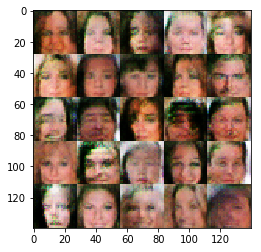

Epoch 1/1... Discriminator Loss: 1.2217... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.0911... Generator Loss: 0.8851
Epoch 1/1... Discriminator Loss: 1.1997... Generator Loss: 0.7873
Epoch 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.7119
Epoch 1/1... Discriminator Loss: 0.9447... Generator Loss: 1.0330
Epoch 1/1... Discriminator Loss: 1.1336... Generator Loss: 0.6726
Epoch 1/1... Discriminator Loss: 0.9722... Generator Loss: 1.0279
Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 0.5892
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.5570
Epoch 1/1... Discriminator Loss: 1.0647... Generator Loss: 0.9291


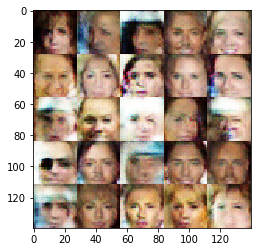

Epoch 1/1... Discriminator Loss: 0.9491... Generator Loss: 0.9481
Epoch 1/1... Discriminator Loss: 1.0746... Generator Loss: 0.8792
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 0.7515
Epoch 1/1... Discriminator Loss: 1.2734... Generator Loss: 0.5794
Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.5823
Epoch 1/1... Discriminator Loss: 1.1008... Generator Loss: 0.7754
Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 0.6430
Epoch 1/1... Discriminator Loss: 0.7989... Generator Loss: 1.3078
Epoch 1/1... Discriminator Loss: 1.0267... Generator Loss: 0.8981
Epoch 1/1... Discriminator Loss: 1.0758... Generator Loss: 0.8621


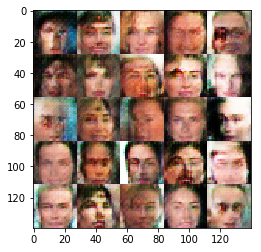

Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 0.6382
Epoch 1/1... Discriminator Loss: 1.2210... Generator Loss: 0.6168
Epoch 1/1... Discriminator Loss: 1.0352... Generator Loss: 1.1006
Epoch 1/1... Discriminator Loss: 1.2305... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.1714... Generator Loss: 0.7705
Epoch 1/1... Discriminator Loss: 1.0928... Generator Loss: 0.8154
Epoch 1/1... Discriminator Loss: 1.0903... Generator Loss: 0.8441
Epoch 1/1... Discriminator Loss: 1.1650... Generator Loss: 0.7745
Epoch 1/1... Discriminator Loss: 1.2034... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.0716... Generator Loss: 0.8093


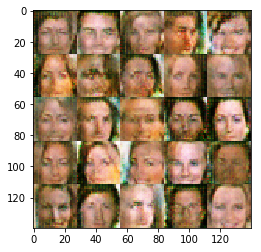

Epoch 1/1... Discriminator Loss: 0.9526... Generator Loss: 1.3279
Epoch 1/1... Discriminator Loss: 1.0114... Generator Loss: 0.9061
Epoch 1/1... Discriminator Loss: 1.0037... Generator Loss: 0.9633
Epoch 1/1... Discriminator Loss: 1.1476... Generator Loss: 0.7865
Epoch 1/1... Discriminator Loss: 1.3569... Generator Loss: 0.6815
Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.0269... Generator Loss: 0.8613
Epoch 1/1... Discriminator Loss: 1.0821... Generator Loss: 1.2462
Epoch 1/1... Discriminator Loss: 1.0292... Generator Loss: 0.9727
Epoch 1/1... Discriminator Loss: 1.0680... Generator Loss: 0.8239


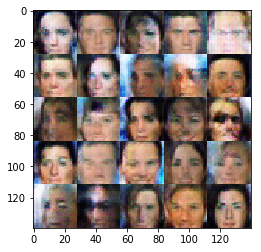

Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.0109... Generator Loss: 0.9847
Epoch 1/1... Discriminator Loss: 1.0337... Generator Loss: 0.9198
Epoch 1/1... Discriminator Loss: 1.0113... Generator Loss: 0.9152
Epoch 1/1... Discriminator Loss: 1.1223... Generator Loss: 0.8033
Epoch 1/1... Discriminator Loss: 1.0808... Generator Loss: 0.9815
Epoch 1/1... Discriminator Loss: 1.1484... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.0914... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 1.2458... Generator Loss: 0.7206
Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.7357


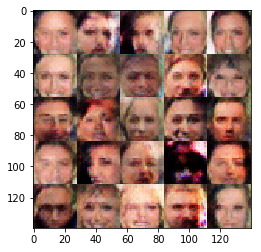

Epoch 1/1... Discriminator Loss: 0.9345... Generator Loss: 0.9679
Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.8413
Epoch 1/1... Discriminator Loss: 1.0522... Generator Loss: 0.9420
Epoch 1/1... Discriminator Loss: 1.0217... Generator Loss: 0.8331
Epoch 1/1... Discriminator Loss: 1.1678... Generator Loss: 0.8576
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.8057
Epoch 1/1... Discriminator Loss: 1.3067... Generator Loss: 0.5281
Epoch 1/1... Discriminator Loss: 1.0726... Generator Loss: 0.8405
Epoch 1/1... Discriminator Loss: 1.0860... Generator Loss: 0.8484
Epoch 1/1... Discriminator Loss: 1.0727... Generator Loss: 0.9353


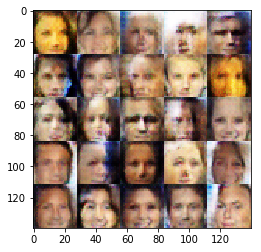

Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 0.8053
Epoch 1/1... Discriminator Loss: 1.3925... Generator Loss: 0.5387
Epoch 1/1... Discriminator Loss: 0.9684... Generator Loss: 1.3033
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.4995
Epoch 1/1... Discriminator Loss: 0.8909... Generator Loss: 1.0132
Epoch 1/1... Discriminator Loss: 1.2314... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.1012... Generator Loss: 0.8579
Epoch 1/1... Discriminator Loss: 1.1999... Generator Loss: 0.7565
Epoch 1/1... Discriminator Loss: 1.0055... Generator Loss: 1.0116


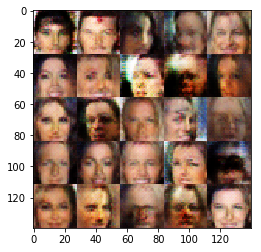

Epoch 1/1... Discriminator Loss: 1.0963... Generator Loss: 0.9184
Epoch 1/1... Discriminator Loss: 1.0415... Generator Loss: 0.9229
Epoch 1/1... Discriminator Loss: 1.1644... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.1198... Generator Loss: 0.7989
Epoch 1/1... Discriminator Loss: 0.9524... Generator Loss: 1.0048
Epoch 1/1... Discriminator Loss: 1.2189... Generator Loss: 0.6784
Epoch 1/1... Discriminator Loss: 1.1158... Generator Loss: 0.8681
Epoch 1/1... Discriminator Loss: 1.0695... Generator Loss: 0.7038
Epoch 1/1... Discriminator Loss: 1.4949... Generator Loss: 0.5155
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.6904


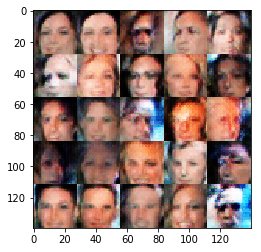

Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 0.6317
Epoch 1/1... Discriminator Loss: 1.1259... Generator Loss: 0.7611
Epoch 1/1... Discriminator Loss: 1.1149... Generator Loss: 0.8044
Epoch 1/1... Discriminator Loss: 1.0022... Generator Loss: 0.9833
Epoch 1/1... Discriminator Loss: 1.2115... Generator Loss: 0.7142
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.6660
Epoch 1/1... Discriminator Loss: 1.1652... Generator Loss: 0.7453
Epoch 1/1... Discriminator Loss: 1.1939... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.4519... Generator Loss: 0.4551
Epoch 1/1... Discriminator Loss: 1.0407... Generator Loss: 0.9940


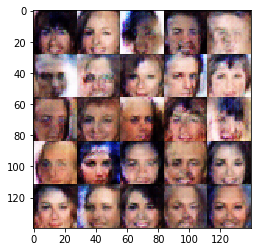

Epoch 1/1... Discriminator Loss: 0.9003... Generator Loss: 1.0413
Epoch 1/1... Discriminator Loss: 1.1136... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.1001... Generator Loss: 0.7038
Epoch 1/1... Discriminator Loss: 0.9123... Generator Loss: 1.0893
Epoch 1/1... Discriminator Loss: 1.2207... Generator Loss: 0.6849
Epoch 1/1... Discriminator Loss: 1.3747... Generator Loss: 0.5536
Epoch 1/1... Discriminator Loss: 1.1705... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 0.8589
Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.5416
Epoch 1/1... Discriminator Loss: 1.1963... Generator Loss: 0.7387


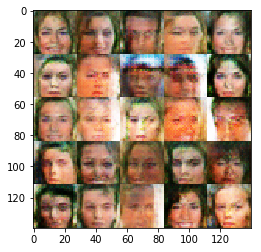

Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.5444
Epoch 1/1... Discriminator Loss: 1.0635... Generator Loss: 0.8114
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.1517... Generator Loss: 0.7878
Epoch 1/1... Discriminator Loss: 1.4455... Generator Loss: 0.5092
Epoch 1/1... Discriminator Loss: 1.2109... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 1.1259... Generator Loss: 0.7528
Epoch 1/1... Discriminator Loss: 1.4999... Generator Loss: 0.4797
Epoch 1/1... Discriminator Loss: 1.5270... Generator Loss: 0.5719


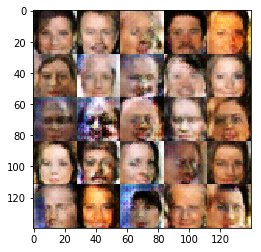

Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 0.6390
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.6284
Epoch 1/1... Discriminator Loss: 1.1620... Generator Loss: 1.0471
Epoch 1/1... Discriminator Loss: 1.0121... Generator Loss: 0.8992
Epoch 1/1... Discriminator Loss: 1.0541... Generator Loss: 0.9301
Epoch 1/1... Discriminator Loss: 1.0761... Generator Loss: 1.0215
Epoch 1/1... Discriminator Loss: 0.9534... Generator Loss: 1.0751
Epoch 1/1... Discriminator Loss: 1.0115... Generator Loss: 0.8586
Epoch 1/1... Discriminator Loss: 1.0045... Generator Loss: 0.8133
Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.5348


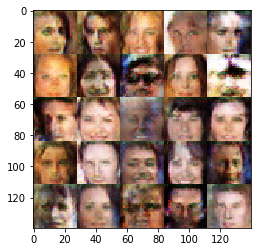

Epoch 1/1... Discriminator Loss: 1.1609... Generator Loss: 0.7460
Epoch 1/1... Discriminator Loss: 1.1160... Generator Loss: 0.8678
Epoch 1/1... Discriminator Loss: 1.2174... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.2888... Generator Loss: 0.6367
Epoch 1/1... Discriminator Loss: 1.1339... Generator Loss: 0.8332
Epoch 1/1... Discriminator Loss: 1.5710... Generator Loss: 0.5611
Epoch 1/1... Discriminator Loss: 1.0197... Generator Loss: 0.9479
Epoch 1/1... Discriminator Loss: 1.0905... Generator Loss: 1.3477
Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 1.1171... Generator Loss: 0.9192


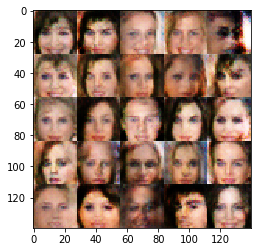

Epoch 1/1... Discriminator Loss: 0.9462... Generator Loss: 1.2613
Epoch 1/1... Discriminator Loss: 1.1516... Generator Loss: 0.7652
Epoch 1/1... Discriminator Loss: 1.0594... Generator Loss: 0.9143
Epoch 1/1... Discriminator Loss: 1.4429... Generator Loss: 0.5192
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.6119
Epoch 1/1... Discriminator Loss: 1.0465... Generator Loss: 0.9329
Epoch 1/1... Discriminator Loss: 1.0817... Generator Loss: 0.9708
Epoch 1/1... Discriminator Loss: 1.1664... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 0.9785... Generator Loss: 0.9625
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.8871


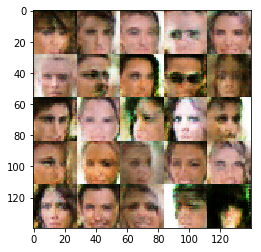

Epoch 1/1... Discriminator Loss: 1.0403... Generator Loss: 0.9047
Epoch 1/1... Discriminator Loss: 1.2751... Generator Loss: 0.6589
Epoch 1/1... Discriminator Loss: 1.2031... Generator Loss: 0.9036
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.6087
Epoch 1/1... Discriminator Loss: 1.2977... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.1122... Generator Loss: 0.9193
Epoch 1/1... Discriminator Loss: 1.0248... Generator Loss: 0.9105
Epoch 1/1... Discriminator Loss: 1.4966... Generator Loss: 0.6528
Epoch 1/1... Discriminator Loss: 0.9074... Generator Loss: 1.0792
Epoch 1/1... Discriminator Loss: 1.1927... Generator Loss: 0.7977


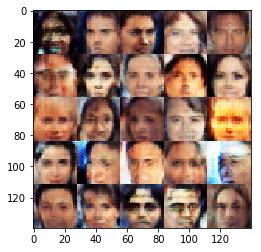

Epoch 1/1... Discriminator Loss: 1.2655... Generator Loss: 0.5956
Epoch 1/1... Discriminator Loss: 1.1364... Generator Loss: 0.7245
Epoch 1/1... Discriminator Loss: 0.8963... Generator Loss: 1.0640
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 0.8049
Epoch 1/1... Discriminator Loss: 1.2440... Generator Loss: 0.5865
Epoch 1/1... Discriminator Loss: 0.9510... Generator Loss: 0.8886
Epoch 1/1... Discriminator Loss: 1.1350... Generator Loss: 0.8416
Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.1630... Generator Loss: 0.7618
Epoch 1/1... Discriminator Loss: 1.1603... Generator Loss: 1.0711


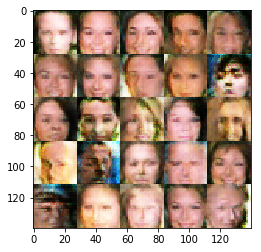

Epoch 1/1... Discriminator Loss: 0.9772... Generator Loss: 1.0787
Epoch 1/1... Discriminator Loss: 0.9993... Generator Loss: 1.0744
Epoch 1/1... Discriminator Loss: 1.1180... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 0.9858... Generator Loss: 0.9929
Epoch 1/1... Discriminator Loss: 1.0687... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 1.0559... Generator Loss: 0.8342
Epoch 1/1... Discriminator Loss: 1.3145... Generator Loss: 0.6834
Epoch 1/1... Discriminator Loss: 1.2291... Generator Loss: 0.6351
Epoch 1/1... Discriminator Loss: 1.0810... Generator Loss: 0.8321
Epoch 1/1... Discriminator Loss: 0.9989... Generator Loss: 0.8661


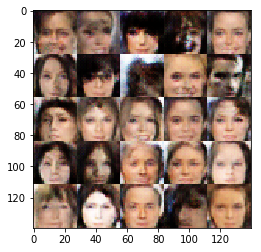

Epoch 1/1... Discriminator Loss: 1.3668... Generator Loss: 0.5693
Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.5680
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.6811
Epoch 1/1... Discriminator Loss: 1.0718... Generator Loss: 0.7996
Epoch 1/1... Discriminator Loss: 1.1290... Generator Loss: 0.8504
Epoch 1/1... Discriminator Loss: 1.0984... Generator Loss: 0.8830
Epoch 1/1... Discriminator Loss: 1.0366... Generator Loss: 1.1496
Epoch 1/1... Discriminator Loss: 1.0876... Generator Loss: 0.7602
Epoch 1/1... Discriminator Loss: 1.2125... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.4470... Generator Loss: 0.5398


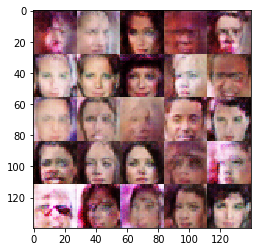

Epoch 1/1... Discriminator Loss: 1.1381... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.5263
Epoch 1/1... Discriminator Loss: 1.0726... Generator Loss: 0.8847
Epoch 1/1... Discriminator Loss: 1.0059... Generator Loss: 0.9078
Epoch 1/1... Discriminator Loss: 0.8369... Generator Loss: 1.2519
Epoch 1/1... Discriminator Loss: 1.1522... Generator Loss: 0.8732
Epoch 1/1... Discriminator Loss: 1.1299... Generator Loss: 0.8094
Epoch 1/1... Discriminator Loss: 1.3826... Generator Loss: 0.6461
Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.5157
Epoch 1/1... Discriminator Loss: 1.6053... Generator Loss: 0.4915


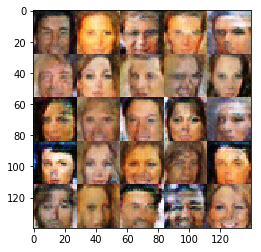

Epoch 1/1... Discriminator Loss: 1.0502... Generator Loss: 0.8994
Epoch 1/1... Discriminator Loss: 1.4569... Generator Loss: 0.4832
Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 0.4728
Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.6063
Epoch 1/1... Discriminator Loss: 1.2091... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.0786... Generator Loss: 0.8663
Epoch 1/1... Discriminator Loss: 1.1190... Generator Loss: 0.7534
Epoch 1/1... Discriminator Loss: 1.1192... Generator Loss: 0.8034
Epoch 1/1... Discriminator Loss: 1.5462... Generator Loss: 0.4622
Epoch 1/1... Discriminator Loss: 1.2587... Generator Loss: 0.6127


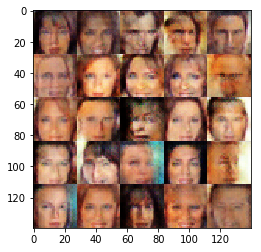

Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 0.9754... Generator Loss: 0.9600
Epoch 1/1... Discriminator Loss: 1.0307... Generator Loss: 0.8385
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 0.9744... Generator Loss: 0.9427
Epoch 1/1... Discriminator Loss: 1.1594... Generator Loss: 0.7259
Epoch 1/1... Discriminator Loss: 1.1316... Generator Loss: 0.7311
Epoch 1/1... Discriminator Loss: 1.0929... Generator Loss: 0.8802
Epoch 1/1... Discriminator Loss: 1.0810... Generator Loss: 0.9205
Epoch 1/1... Discriminator Loss: 0.9273... Generator Loss: 1.0331


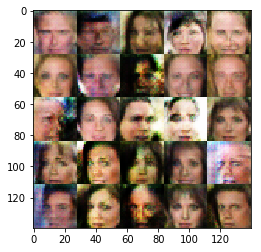

Epoch 1/1... Discriminator Loss: 1.1024... Generator Loss: 0.7469
Epoch 1/1... Discriminator Loss: 1.2377... Generator Loss: 0.6415
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.5961
Epoch 1/1... Discriminator Loss: 1.2299... Generator Loss: 0.7268
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.5189
Epoch 1/1... Discriminator Loss: 1.1336... Generator Loss: 0.7301
Epoch 1/1... Discriminator Loss: 1.3227... Generator Loss: 0.6164
Epoch 1/1... Discriminator Loss: 1.1456... Generator Loss: 0.7211
Epoch 1/1... Discriminator Loss: 1.2161... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.3533... Generator Loss: 0.6201


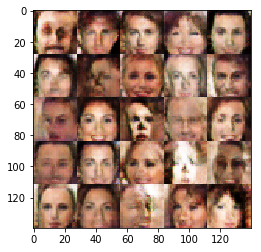

Epoch 1/1... Discriminator Loss: 1.0603... Generator Loss: 0.8060
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.5526
Epoch 1/1... Discriminator Loss: 1.0098... Generator Loss: 0.9308
Epoch 1/1... Discriminator Loss: 1.2749... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.1726... Generator Loss: 0.7391
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.5877
Epoch 1/1... Discriminator Loss: 1.1361... Generator Loss: 0.9350
Epoch 1/1... Discriminator Loss: 1.1158... Generator Loss: 0.7138
Epoch 1/1... Discriminator Loss: 0.9833... Generator Loss: 0.8977
Epoch 1/1... Discriminator Loss: 0.9836... Generator Loss: 0.9872


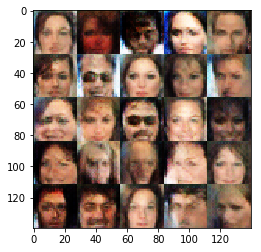

Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 0.6830
Epoch 1/1... Discriminator Loss: 1.0634... Generator Loss: 0.7829
Epoch 1/1... Discriminator Loss: 1.0196... Generator Loss: 0.9734
Epoch 1/1... Discriminator Loss: 1.2609... Generator Loss: 0.7519
Epoch 1/1... Discriminator Loss: 1.2446... Generator Loss: 0.7225
Epoch 1/1... Discriminator Loss: 0.9911... Generator Loss: 1.1169
Epoch 1/1... Discriminator Loss: 1.2628... Generator Loss: 0.6722
Epoch 1/1... Discriminator Loss: 1.1095... Generator Loss: 0.6829
Epoch 1/1... Discriminator Loss: 1.1719... Generator Loss: 0.9684
Epoch 1/1... Discriminator Loss: 1.0049... Generator Loss: 0.8721


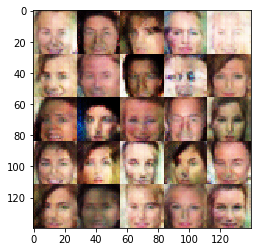

Epoch 1/1... Discriminator Loss: 1.2487... Generator Loss: 0.7200
Epoch 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.6181
Epoch 1/1... Discriminator Loss: 1.1095... Generator Loss: 0.7910
Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.7455
Epoch 1/1... Discriminator Loss: 1.0757... Generator Loss: 0.9450
Epoch 1/1... Discriminator Loss: 1.1818... Generator Loss: 0.7919
Epoch 1/1... Discriminator Loss: 1.2792... Generator Loss: 0.6903
Epoch 1/1... Discriminator Loss: 1.0529... Generator Loss: 0.7814
Epoch 1/1... Discriminator Loss: 1.2430... Generator Loss: 0.8665
Epoch 1/1... Discriminator Loss: 0.9406... Generator Loss: 1.0561


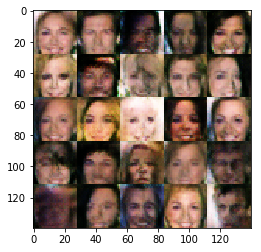

Epoch 1/1... Discriminator Loss: 1.2698... Generator Loss: 0.6650
Epoch 1/1... Discriminator Loss: 1.0897... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.6032
Epoch 1/1... Discriminator Loss: 1.1548... Generator Loss: 0.7694
Epoch 1/1... Discriminator Loss: 1.4193... Generator Loss: 0.6279
Epoch 1/1... Discriminator Loss: 1.1683... Generator Loss: 0.6886
Epoch 1/1... Discriminator Loss: 1.1303... Generator Loss: 0.7205
Epoch 1/1... Discriminator Loss: 1.1108... Generator Loss: 0.8238
Epoch 1/1... Discriminator Loss: 1.0398... Generator Loss: 0.9338
Epoch 1/1... Discriminator Loss: 0.8577... Generator Loss: 1.1780


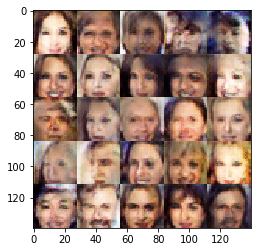

Epoch 1/1... Discriminator Loss: 1.7065... Generator Loss: 0.4384
Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.6118
Epoch 1/1... Discriminator Loss: 1.5030... Generator Loss: 0.4375
Epoch 1/1... Discriminator Loss: 1.4469... Generator Loss: 0.6177
Epoch 1/1... Discriminator Loss: 1.2342... Generator Loss: 0.7200
Epoch 1/1... Discriminator Loss: 1.5352... Generator Loss: 0.4680
Epoch 1/1... Discriminator Loss: 1.0314... Generator Loss: 0.8198
Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 0.9248
Epoch 1/1... Discriminator Loss: 1.0793... Generator Loss: 0.8185
Epoch 1/1... Discriminator Loss: 1.1870... Generator Loss: 0.7636


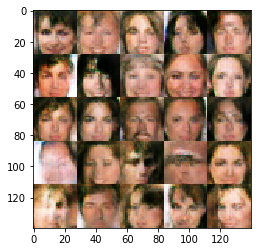

Epoch 1/1... Discriminator Loss: 1.3261... Generator Loss: 0.6257
Epoch 1/1... Discriminator Loss: 1.1113... Generator Loss: 0.7677
Epoch 1/1... Discriminator Loss: 1.1960... Generator Loss: 0.6733
Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 0.8438
Epoch 1/1... Discriminator Loss: 1.2240... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 1.4642... Generator Loss: 0.4895
Epoch 1/1... Discriminator Loss: 1.0944... Generator Loss: 1.0374
Epoch 1/1... Discriminator Loss: 1.3846... Generator Loss: 0.6070
Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.5818
Epoch 1/1... Discriminator Loss: 1.2851... Generator Loss: 0.6716


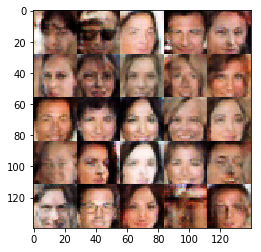

Epoch 1/1... Discriminator Loss: 1.0289... Generator Loss: 0.8373
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.6405
Epoch 1/1... Discriminator Loss: 1.0870... Generator Loss: 0.8935
Epoch 1/1... Discriminator Loss: 1.0090... Generator Loss: 0.9315
Epoch 1/1... Discriminator Loss: 1.0246... Generator Loss: 0.9736
Epoch 1/1... Discriminator Loss: 1.2833... Generator Loss: 0.6249
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.1575... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.1700... Generator Loss: 0.7422


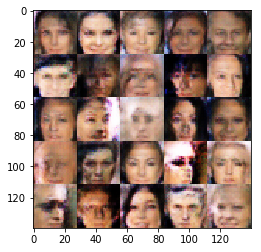

Epoch 1/1... Discriminator Loss: 1.1696... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 0.7430
Epoch 1/1... Discriminator Loss: 1.1862... Generator Loss: 0.7607
Epoch 1/1... Discriminator Loss: 1.1339... Generator Loss: 0.9904
Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.7111
Epoch 1/1... Discriminator Loss: 1.2155... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.2524... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 1.0600... Generator Loss: 0.8556
Epoch 1/1... Discriminator Loss: 1.1070... Generator Loss: 0.9072
Epoch 1/1... Discriminator Loss: 1.2475... Generator Loss: 0.6378


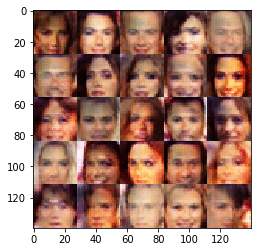

Epoch 1/1... Discriminator Loss: 1.2042... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.1727... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.4932
Epoch 1/1... Discriminator Loss: 0.9876... Generator Loss: 0.9312
Epoch 1/1... Discriminator Loss: 1.0056... Generator Loss: 1.0016
Epoch 1/1... Discriminator Loss: 0.8980... Generator Loss: 1.1702
Epoch 1/1... Discriminator Loss: 1.0424... Generator Loss: 0.9242
Epoch 1/1... Discriminator Loss: 1.1613... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 1.2227... Generator Loss: 0.6993
Epoch 1/1... Discriminator Loss: 1.4301... Generator Loss: 0.4691


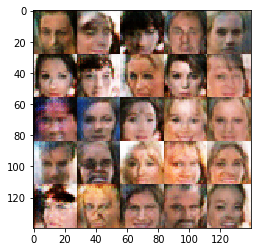

Epoch 1/1... Discriminator Loss: 1.1410... Generator Loss: 0.6702
Epoch 1/1... Discriminator Loss: 0.9972... Generator Loss: 0.9889
Epoch 1/1... Discriminator Loss: 1.0362... Generator Loss: 0.8677
Epoch 1/1... Discriminator Loss: 1.2524... Generator Loss: 0.6285
Epoch 1/1... Discriminator Loss: 1.2945... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 0.9666... Generator Loss: 0.9509
Epoch 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.6372
Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 0.6304
Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 0.8123


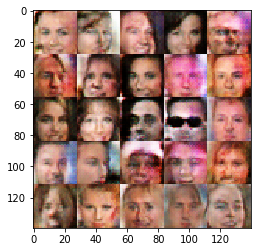

Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.6216
Epoch 1/1... Discriminator Loss: 1.1491... Generator Loss: 0.8418
Epoch 1/1... Discriminator Loss: 1.2069... Generator Loss: 0.9544
Epoch 1/1... Discriminator Loss: 1.1524... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 1.1919... Generator Loss: 0.7544
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.7793
Epoch 1/1... Discriminator Loss: 0.9980... Generator Loss: 0.9272
Epoch 1/1... Discriminator Loss: 1.5069... Generator Loss: 0.6379
Epoch 1/1... Discriminator Loss: 1.1284... Generator Loss: 0.7469
Epoch 1/1... Discriminator Loss: 1.0889... Generator Loss: 0.8025


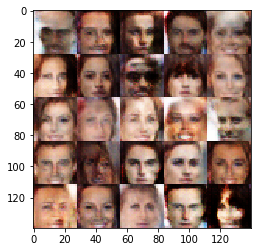

Epoch 1/1... Discriminator Loss: 1.1778... Generator Loss: 0.7585
Epoch 1/1... Discriminator Loss: 1.1280... Generator Loss: 0.8234
Epoch 1/1... Discriminator Loss: 1.0182... Generator Loss: 0.9123
Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.5134
Epoch 1/1... Discriminator Loss: 1.1479... Generator Loss: 0.7788
Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 0.5911
Epoch 1/1... Discriminator Loss: 1.2208... Generator Loss: 0.8068
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.7499


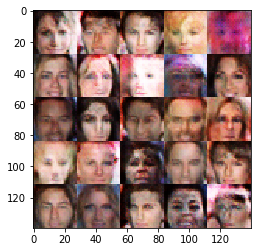

Epoch 1/1... Discriminator Loss: 1.0555... Generator Loss: 0.8811
Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.5316
Epoch 1/1... Discriminator Loss: 0.9979... Generator Loss: 0.9081
Epoch 1/1... Discriminator Loss: 1.2115... Generator Loss: 0.6704
Epoch 1/1... Discriminator Loss: 1.0878... Generator Loss: 0.7739
Epoch 1/1... Discriminator Loss: 1.0534... Generator Loss: 0.8222
Epoch 1/1... Discriminator Loss: 1.0042... Generator Loss: 0.9167
Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 0.7820
Epoch 1/1... Discriminator Loss: 1.5101... Generator Loss: 0.5857
Epoch 1/1... Discriminator Loss: 1.0992... Generator Loss: 0.9189


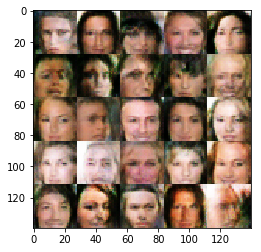

Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 1.0800... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.2648... Generator Loss: 0.6229
Epoch 1/1... Discriminator Loss: 0.9989... Generator Loss: 0.8856
Epoch 1/1... Discriminator Loss: 0.9881... Generator Loss: 0.8402
Epoch 1/1... Discriminator Loss: 1.4726... Generator Loss: 0.5413
Epoch 1/1... Discriminator Loss: 1.2417... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.3128... Generator Loss: 0.6161
Epoch 1/1... Discriminator Loss: 1.0369... Generator Loss: 0.9713
Epoch 1/1... Discriminator Loss: 1.0168... Generator Loss: 0.9950


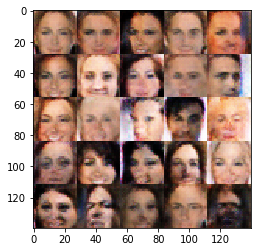

Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.0656... Generator Loss: 0.7909
Epoch 1/1... Discriminator Loss: 1.0670... Generator Loss: 0.7753
Epoch 1/1... Discriminator Loss: 1.0078... Generator Loss: 0.9680
Epoch 1/1... Discriminator Loss: 1.0960... Generator Loss: 0.8679
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.5648
Epoch 1/1... Discriminator Loss: 1.1609... Generator Loss: 0.6962
Epoch 1/1... Discriminator Loss: 1.2957... Generator Loss: 0.6299
Epoch 1/1... Discriminator Loss: 1.1449... Generator Loss: 0.7970
Epoch 1/1... Discriminator Loss: 0.8350... Generator Loss: 1.0612


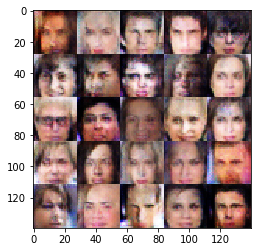

Epoch 1/1... Discriminator Loss: 1.2433... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 1.3267... Generator Loss: 0.7030
Epoch 1/1... Discriminator Loss: 1.0702... Generator Loss: 1.0188
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 0.6399
Epoch 1/1... Discriminator Loss: 1.1233... Generator Loss: 0.7563
Epoch 1/1... Discriminator Loss: 1.1378... Generator Loss: 0.6962
Epoch 1/1... Discriminator Loss: 1.0001... Generator Loss: 1.0477
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.7679
Epoch 1/1... Discriminator Loss: 1.1554... Generator Loss: 0.8693


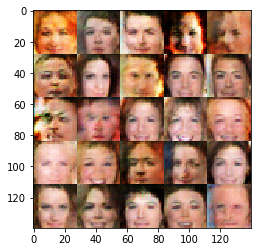

Epoch 1/1... Discriminator Loss: 1.6173... Generator Loss: 0.4850
Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 0.8880
Epoch 1/1... Discriminator Loss: 1.1096... Generator Loss: 0.8573
Epoch 1/1... Discriminator Loss: 1.1405... Generator Loss: 0.7834
Epoch 1/1... Discriminator Loss: 1.2350... Generator Loss: 0.6449
Epoch 1/1... Discriminator Loss: 1.0295... Generator Loss: 0.8611
Epoch 1/1... Discriminator Loss: 1.1741... Generator Loss: 0.6698
Epoch 1/1... Discriminator Loss: 1.2755... Generator Loss: 0.7115
Epoch 1/1... Discriminator Loss: 1.0960... Generator Loss: 0.8015
Epoch 1/1... Discriminator Loss: 1.0375... Generator Loss: 0.9622


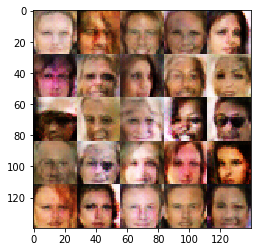

Epoch 1/1... Discriminator Loss: 1.1794... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.3525... Generator Loss: 0.5664
Epoch 1/1... Discriminator Loss: 0.9988... Generator Loss: 0.9542
Epoch 1/1... Discriminator Loss: 0.9603... Generator Loss: 0.9928
Epoch 1/1... Discriminator Loss: 1.1329... Generator Loss: 0.7776
Epoch 1/1... Discriminator Loss: 1.3519... Generator Loss: 0.5654
Epoch 1/1... Discriminator Loss: 1.0585... Generator Loss: 0.8867
Epoch 1/1... Discriminator Loss: 1.0510... Generator Loss: 0.9545
Epoch 1/1... Discriminator Loss: 1.0009... Generator Loss: 0.9015
Epoch 1/1... Discriminator Loss: 1.0892... Generator Loss: 0.8526


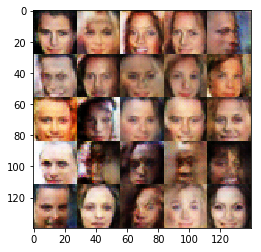

Epoch 1/1... Discriminator Loss: 1.1093... Generator Loss: 0.7716
Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 0.8666
Epoch 1/1... Discriminator Loss: 1.4461... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.2133... Generator Loss: 0.7082
Epoch 1/1... Discriminator Loss: 1.1970... Generator Loss: 0.7197
Epoch 1/1... Discriminator Loss: 1.0955... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.0882... Generator Loss: 0.8095
Epoch 1/1... Discriminator Loss: 1.3055... Generator Loss: 0.6668
Epoch 1/1... Discriminator Loss: 1.2619... Generator Loss: 0.5820
Epoch 1/1... Discriminator Loss: 1.3069... Generator Loss: 0.5532


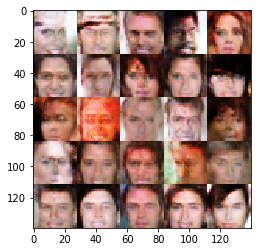

Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.5277
Epoch 1/1... Discriminator Loss: 0.9248... Generator Loss: 0.9275
Epoch 1/1... Discriminator Loss: 1.0085... Generator Loss: 0.9543
Epoch 1/1... Discriminator Loss: 1.1194... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 1.0816... Generator Loss: 0.8731
Epoch 1/1... Discriminator Loss: 0.9998... Generator Loss: 0.9026
Epoch 1/1... Discriminator Loss: 1.0719... Generator Loss: 0.8508
Epoch 1/1... Discriminator Loss: 1.3585... Generator Loss: 0.5940
Epoch 1/1... Discriminator Loss: 0.9631... Generator Loss: 1.1718
Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.6028


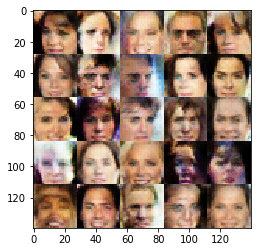

Epoch 1/1... Discriminator Loss: 1.2986... Generator Loss: 0.7149
Epoch 1/1... Discriminator Loss: 0.9884... Generator Loss: 0.9143
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.1157... Generator Loss: 0.7626
Epoch 1/1... Discriminator Loss: 1.2912... Generator Loss: 0.7618
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.5461
Epoch 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.7082
Epoch 1/1... Discriminator Loss: 1.1998... Generator Loss: 0.7488
Epoch 1/1... Discriminator Loss: 1.0903... Generator Loss: 0.8280
Epoch 1/1... Discriminator Loss: 1.0542... Generator Loss: 0.9501


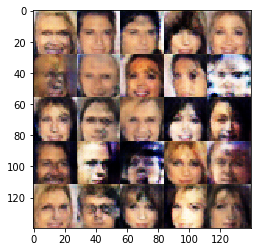

Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 0.5734
Epoch 1/1... Discriminator Loss: 1.0024... Generator Loss: 0.8795
Epoch 1/1... Discriminator Loss: 1.0754... Generator Loss: 0.9287
Epoch 1/1... Discriminator Loss: 1.1725... Generator Loss: 0.9005
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.5433
Epoch 1/1... Discriminator Loss: 1.3722... Generator Loss: 0.5786
Epoch 1/1... Discriminator Loss: 1.1037... Generator Loss: 0.8501
Epoch 1/1... Discriminator Loss: 1.2257... Generator Loss: 0.6826
Epoch 1/1... Discriminator Loss: 1.1254... Generator Loss: 1.1515
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.5951


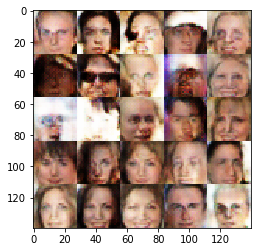

Epoch 1/1... Discriminator Loss: 1.2318... Generator Loss: 0.6568
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 1.2040... Generator Loss: 0.8156
Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.6458
Epoch 1/1... Discriminator Loss: 1.4324... Generator Loss: 0.5719
Epoch 1/1... Discriminator Loss: 1.3924... Generator Loss: 0.5987
Epoch 1/1... Discriminator Loss: 1.1442... Generator Loss: 0.8041
Epoch 1/1... Discriminator Loss: 1.0699... Generator Loss: 0.7932
Epoch 1/1... Discriminator Loss: 1.2027... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 0.8917... Generator Loss: 1.0988


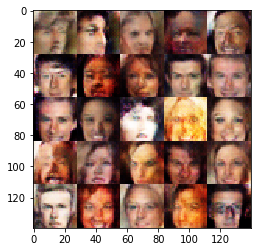

Epoch 1/1... Discriminator Loss: 1.1530... Generator Loss: 0.7538
Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.3484... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 0.9323... Generator Loss: 0.9507
Epoch 1/1... Discriminator Loss: 1.2295... Generator Loss: 0.8150
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 0.7003
Epoch 1/1... Discriminator Loss: 1.1471... Generator Loss: 0.8343
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.6148
Epoch 1/1... Discriminator Loss: 1.1035... Generator Loss: 0.8622
Epoch 1/1... Discriminator Loss: 1.1224... Generator Loss: 0.8660


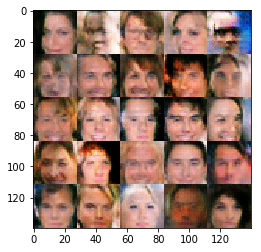

Epoch 1/1... Discriminator Loss: 1.1944... Generator Loss: 0.7590
Epoch 1/1... Discriminator Loss: 1.0798... Generator Loss: 0.8771
Epoch 1/1... Discriminator Loss: 1.2590... Generator Loss: 0.6811
Epoch 1/1... Discriminator Loss: 1.1737... Generator Loss: 0.8457
Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 1.1306... Generator Loss: 0.7854
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.6416
Epoch 1/1... Discriminator Loss: 1.1927... Generator Loss: 0.6393
Epoch 1/1... Discriminator Loss: 1.3257... Generator Loss: 0.5970
Epoch 1/1... Discriminator Loss: 1.4158... Generator Loss: 0.5632


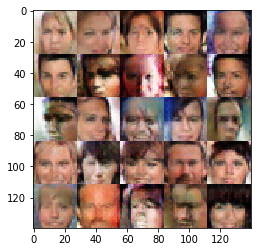

Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.5477
Epoch 1/1... Discriminator Loss: 1.0883... Generator Loss: 0.9567
Epoch 1/1... Discriminator Loss: 1.0777... Generator Loss: 0.9371
Epoch 1/1... Discriminator Loss: 1.1162... Generator Loss: 0.9095
Epoch 1/1... Discriminator Loss: 1.2626... Generator Loss: 0.6981
Epoch 1/1... Discriminator Loss: 1.1688... Generator Loss: 0.6971
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.6335
Epoch 1/1... Discriminator Loss: 1.1531... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.5849
Epoch 1/1... Discriminator Loss: 1.2359... Generator Loss: 0.8308


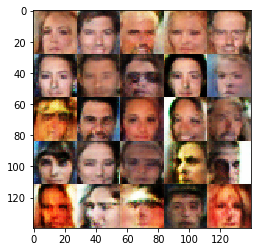

Epoch 1/1... Discriminator Loss: 1.0603... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 1.2392... Generator Loss: 0.7585
Epoch 1/1... Discriminator Loss: 1.2659... Generator Loss: 0.7891
Epoch 1/1... Discriminator Loss: 1.1445... Generator Loss: 0.9728
Epoch 1/1... Discriminator Loss: 1.0322... Generator Loss: 0.8653
Epoch 1/1... Discriminator Loss: 0.9920... Generator Loss: 0.9481
Epoch 1/1... Discriminator Loss: 1.2897... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.9276
Epoch 1/1... Discriminator Loss: 1.0761... Generator Loss: 0.8587
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 0.6030


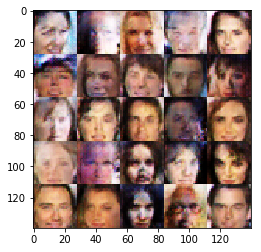

Epoch 1/1... Discriminator Loss: 1.0875... Generator Loss: 0.7977
Epoch 1/1... Discriminator Loss: 1.2049... Generator Loss: 0.6580
Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 0.8422
Epoch 1/1... Discriminator Loss: 1.1434... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.4903
Epoch 1/1... Discriminator Loss: 1.4834... Generator Loss: 0.5218
Epoch 1/1... Discriminator Loss: 1.1460... Generator Loss: 0.7336
Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.8520
Epoch 1/1... Discriminator Loss: 1.3010... Generator Loss: 0.6170
Epoch 1/1... Discriminator Loss: 1.1494... Generator Loss: 0.7964


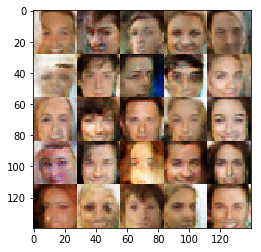

Epoch 1/1... Discriminator Loss: 1.0665... Generator Loss: 0.8946
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 0.7727
Epoch 1/1... Discriminator Loss: 1.1101... Generator Loss: 0.8085
Epoch 1/1... Discriminator Loss: 0.9871... Generator Loss: 1.0405
Epoch 1/1... Discriminator Loss: 1.3170... Generator Loss: 0.6028
Epoch 1/1... Discriminator Loss: 1.2817... Generator Loss: 0.7305
Epoch 1/1... Discriminator Loss: 1.4284... Generator Loss: 0.5329
Epoch 1/1... Discriminator Loss: 1.1494... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 1.0591... Generator Loss: 0.9084
Epoch 1/1... Discriminator Loss: 1.1139... Generator Loss: 0.8943


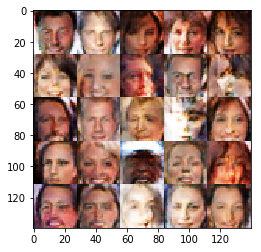

Epoch 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.6319
Epoch 1/1... Discriminator Loss: 1.1715... Generator Loss: 0.7488
Epoch 1/1... Discriminator Loss: 1.2864... Generator Loss: 0.7911
Epoch 1/1... Discriminator Loss: 1.2536... Generator Loss: 0.6490
Epoch 1/1... Discriminator Loss: 1.1958... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.0413... Generator Loss: 1.0261
Epoch 1/1... Discriminator Loss: 0.9409... Generator Loss: 1.1718
Epoch 1/1... Discriminator Loss: 1.2308... Generator Loss: 0.6548
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.7552
Epoch 1/1... Discriminator Loss: 1.1533... Generator Loss: 0.7685


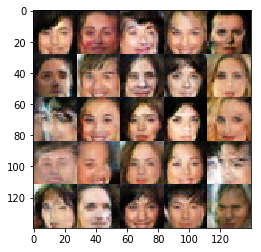

Epoch 1/1... Discriminator Loss: 1.1778... Generator Loss: 0.7674
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.5585
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.7657
Epoch 1/1... Discriminator Loss: 1.0533... Generator Loss: 1.0798
Epoch 1/1... Discriminator Loss: 1.0747... Generator Loss: 0.7860
Epoch 1/1... Discriminator Loss: 1.0169... Generator Loss: 0.9271
Epoch 1/1... Discriminator Loss: 1.1518... Generator Loss: 0.7751
Epoch 1/1... Discriminator Loss: 1.0987... Generator Loss: 0.8612
Epoch 1/1... Discriminator Loss: 1.0964... Generator Loss: 0.8782
Epoch 1/1... Discriminator Loss: 1.0432... Generator Loss: 0.8858


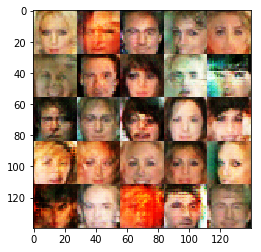

Epoch 1/1... Discriminator Loss: 1.0705... Generator Loss: 0.7715
Epoch 1/1... Discriminator Loss: 1.2041... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.1948... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 0.9933... Generator Loss: 0.9626
Epoch 1/1... Discriminator Loss: 1.2870... Generator Loss: 0.5736
Epoch 1/1... Discriminator Loss: 1.1920... Generator Loss: 0.6967
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.6649
Epoch 1/1... Discriminator Loss: 1.3392... Generator Loss: 0.6397
Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 0.6975
Epoch 1/1... Discriminator Loss: 1.3275... Generator Loss: 0.6395


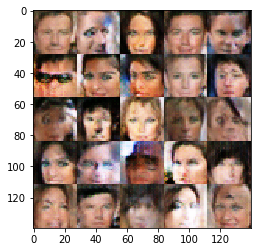

Epoch 1/1... Discriminator Loss: 1.0207... Generator Loss: 0.9177
Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 0.7028
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 1.2273... Generator Loss: 0.7155
Epoch 1/1... Discriminator Loss: 1.2958... Generator Loss: 0.6891
Epoch 1/1... Discriminator Loss: 1.1540... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.2175... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 1.5820... Generator Loss: 0.4943
Epoch 1/1... Discriminator Loss: 1.1904... Generator Loss: 0.8247
Epoch 1/1... Discriminator Loss: 1.0251... Generator Loss: 1.0908


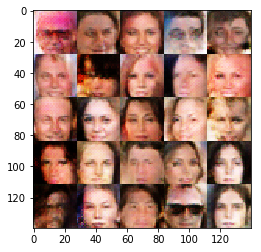

Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.5543
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 1.4341... Generator Loss: 0.4887
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.6270
Epoch 1/1... Discriminator Loss: 1.2230... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.0761... Generator Loss: 0.9327
Epoch 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 1.0799... Generator Loss: 0.8454
Epoch 1/1... Discriminator Loss: 1.0635... Generator Loss: 0.8217
Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 0.8633


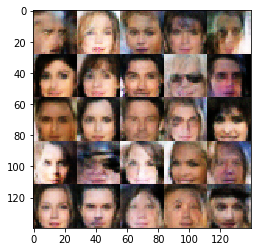

Epoch 1/1... Discriminator Loss: 1.1361... Generator Loss: 0.7972
Epoch 1/1... Discriminator Loss: 1.1281... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.1470... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.2761... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 0.9501... Generator Loss: 0.9917
Epoch 1/1... Discriminator Loss: 1.2548... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 1.1324... Generator Loss: 0.7659
Epoch 1/1... Discriminator Loss: 1.2575... Generator Loss: 0.6916
Epoch 1/1... Discriminator Loss: 1.5351... Generator Loss: 0.4992
Epoch 1/1... Discriminator Loss: 1.1120... Generator Loss: 0.8481


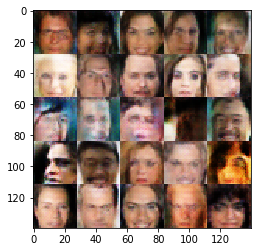

Epoch 1/1... Discriminator Loss: 1.1082... Generator Loss: 0.8568
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.5908
Epoch 1/1... Discriminator Loss: 0.9469... Generator Loss: 0.9792
Epoch 1/1... Discriminator Loss: 1.0441... Generator Loss: 0.8067
Epoch 1/1... Discriminator Loss: 1.1433... Generator Loss: 0.8781
Epoch 1/1... Discriminator Loss: 1.0818... Generator Loss: 0.8074
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 0.8571
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.6758
Epoch 1/1... Discriminator Loss: 1.0011... Generator Loss: 0.8840
Epoch 1/1... Discriminator Loss: 1.3253... Generator Loss: 0.5630


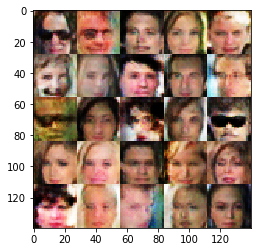

Epoch 1/1... Discriminator Loss: 1.2200... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.3424... Generator Loss: 0.7208
Epoch 1/1... Discriminator Loss: 1.2322... Generator Loss: 0.7660
Epoch 1/1... Discriminator Loss: 0.9786... Generator Loss: 0.9476
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.5573
Epoch 1/1... Discriminator Loss: 1.0545... Generator Loss: 0.7810
Epoch 1/1... Discriminator Loss: 1.1321... Generator Loss: 0.7325
Epoch 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.9793... Generator Loss: 0.3272
Epoch 1/1... Discriminator Loss: 1.0865... Generator Loss: 0.7639


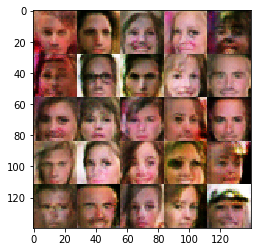

Epoch 1/1... Discriminator Loss: 1.3699... Generator Loss: 0.6236
Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.3340... Generator Loss: 0.5657
Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.3524... Generator Loss: 0.5483
Epoch 1/1... Discriminator Loss: 1.2678... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.6220... Generator Loss: 0.4279
Epoch 1/1... Discriminator Loss: 1.3239... Generator Loss: 0.5983
Epoch 1/1... Discriminator Loss: 1.1520... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 0.5449


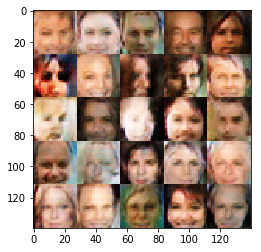

Epoch 1/1... Discriminator Loss: 1.1851... Generator Loss: 0.6759
Epoch 1/1... Discriminator Loss: 1.1124... Generator Loss: 0.7714
Epoch 1/1... Discriminator Loss: 1.1236... Generator Loss: 0.8848
Epoch 1/1... Discriminator Loss: 1.1286... Generator Loss: 0.7864
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.5026
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.5960
Epoch 1/1... Discriminator Loss: 1.0974... Generator Loss: 0.8012
Epoch 1/1... Discriminator Loss: 1.0410... Generator Loss: 0.8778
Epoch 1/1... Discriminator Loss: 1.2724... Generator Loss: 0.7374
Epoch 1/1... Discriminator Loss: 0.9843... Generator Loss: 0.9512


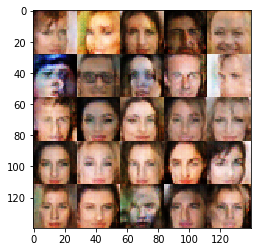

Epoch 1/1... Discriminator Loss: 1.2495... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 1.1353... Generator Loss: 0.7713
Epoch 1/1... Discriminator Loss: 1.1501... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 1.4821... Generator Loss: 0.4911
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.6076
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 0.8210
Epoch 1/1... Discriminator Loss: 1.1982... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.0816... Generator Loss: 0.8272
Epoch 1/1... Discriminator Loss: 1.0906... Generator Loss: 0.8965
Epoch 1/1... Discriminator Loss: 1.1903... Generator Loss: 0.6485


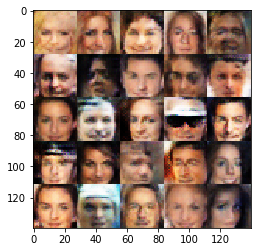

Epoch 1/1... Discriminator Loss: 1.1251... Generator Loss: 0.8072
Epoch 1/1... Discriminator Loss: 1.1954... Generator Loss: 0.7227
Epoch 1/1... Discriminator Loss: 1.5476... Generator Loss: 0.4756
Epoch 1/1... Discriminator Loss: 1.1382... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 0.9140... Generator Loss: 1.1475
Epoch 1/1... Discriminator Loss: 1.2384... Generator Loss: 0.6837
Epoch 1/1... Discriminator Loss: 1.2690... Generator Loss: 0.6157
Epoch 1/1... Discriminator Loss: 1.2637... Generator Loss: 0.7630
Epoch 1/1... Discriminator Loss: 1.0966... Generator Loss: 0.8434
Epoch 1/1... Discriminator Loss: 1.2372... Generator Loss: 0.7446


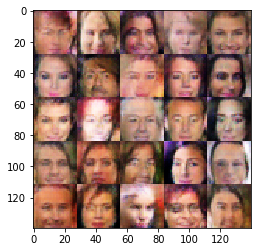

Epoch 1/1... Discriminator Loss: 1.2592... Generator Loss: 0.6997
Epoch 1/1... Discriminator Loss: 1.2544... Generator Loss: 0.7695
Epoch 1/1... Discriminator Loss: 1.0700... Generator Loss: 0.9044
Epoch 1/1... Discriminator Loss: 0.9772... Generator Loss: 0.9348
Epoch 1/1... Discriminator Loss: 1.0503... Generator Loss: 0.8855
Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 0.6467
Epoch 1/1... Discriminator Loss: 1.2059... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 0.6278
Epoch 1/1... Discriminator Loss: 1.0867... Generator Loss: 0.8773
Epoch 1/1... Discriminator Loss: 1.0241... Generator Loss: 1.0093


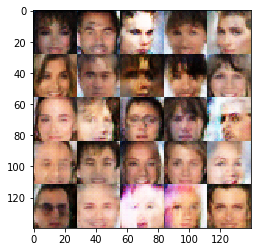

Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.1700... Generator Loss: 0.6988
Epoch 1/1... Discriminator Loss: 0.9503... Generator Loss: 1.0113
Epoch 1/1... Discriminator Loss: 1.1199... Generator Loss: 0.8344
Epoch 1/1... Discriminator Loss: 1.1782... Generator Loss: 0.7537
Epoch 1/1... Discriminator Loss: 1.0098... Generator Loss: 0.9639
Epoch 1/1... Discriminator Loss: 1.0579... Generator Loss: 0.7855
Epoch 1/1... Discriminator Loss: 1.1559... Generator Loss: 0.8353
Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.5638


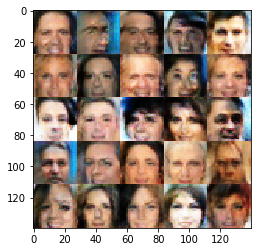

Epoch 1/1... Discriminator Loss: 0.9601... Generator Loss: 0.9370
Epoch 1/1... Discriminator Loss: 1.1880... Generator Loss: 0.8027
Epoch 1/1... Discriminator Loss: 1.0814... Generator Loss: 0.8705
Epoch 1/1... Discriminator Loss: 1.2315... Generator Loss: 0.6976
Epoch 1/1... Discriminator Loss: 1.2151... Generator Loss: 0.6384
Epoch 1/1... Discriminator Loss: 1.2231... Generator Loss: 0.6692
Epoch 1/1... Discriminator Loss: 1.0806... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 1.0856... Generator Loss: 0.8470
Epoch 1/1... Discriminator Loss: 1.0558... Generator Loss: 0.8354
Epoch 1/1... Discriminator Loss: 1.2359... Generator Loss: 0.7131


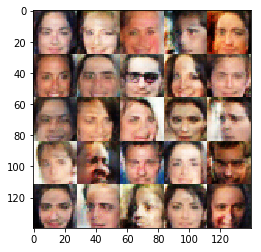

Epoch 1/1... Discriminator Loss: 1.1798... Generator Loss: 0.7951
Epoch 1/1... Discriminator Loss: 1.0819... Generator Loss: 0.9823
Epoch 1/1... Discriminator Loss: 1.0556... Generator Loss: 0.8716
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.6815
Epoch 1/1... Discriminator Loss: 1.0386... Generator Loss: 0.8793
Epoch 1/1... Discriminator Loss: 1.2726... Generator Loss: 0.5750
Epoch 1/1... Discriminator Loss: 1.2793... Generator Loss: 0.6001
Epoch 1/1... Discriminator Loss: 1.1604... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.0197... Generator Loss: 0.9058
Epoch 1/1... Discriminator Loss: 1.3135... Generator Loss: 0.6398


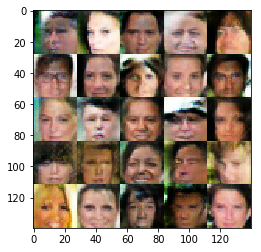

Epoch 1/1... Discriminator Loss: 1.1498... Generator Loss: 0.7988
Epoch 1/1... Discriminator Loss: 1.1827... Generator Loss: 0.8092
Epoch 1/1... Discriminator Loss: 1.1046... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 1.1538... Generator Loss: 0.8130
Epoch 1/1... Discriminator Loss: 1.0912... Generator Loss: 0.8632
Epoch 1/1... Discriminator Loss: 1.3155... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.2087... Generator Loss: 0.6414
Epoch 1/1... Discriminator Loss: 1.0170... Generator Loss: 0.8831
Epoch 1/1... Discriminator Loss: 1.2090... Generator Loss: 0.6643
Epoch 1/1... Discriminator Loss: 1.3065... Generator Loss: 0.5906


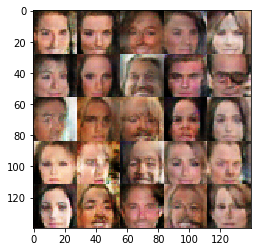

Epoch 1/1... Discriminator Loss: 1.3280... Generator Loss: 0.6430
Epoch 1/1... Discriminator Loss: 1.1338... Generator Loss: 0.7628
Epoch 1/1... Discriminator Loss: 1.0449... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.2464... Generator Loss: 0.7167
Epoch 1/1... Discriminator Loss: 1.1413... Generator Loss: 0.8182
Epoch 1/1... Discriminator Loss: 1.5000... Generator Loss: 0.4867
Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.6506
Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.5585
Epoch 1/1... Discriminator Loss: 1.0222... Generator Loss: 0.8880
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 0.7112


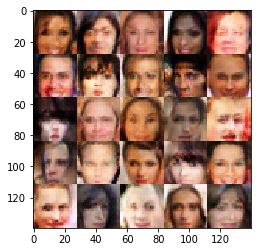

Epoch 1/1... Discriminator Loss: 0.9509... Generator Loss: 1.1389
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.6426
Epoch 1/1... Discriminator Loss: 1.2008... Generator Loss: 0.6814
Epoch 1/1... Discriminator Loss: 1.1865... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 1.1094... Generator Loss: 0.8000
Epoch 1/1... Discriminator Loss: 1.1404... Generator Loss: 0.6887
Epoch 1/1... Discriminator Loss: 1.1732... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 0.6361
Epoch 1/1... Discriminator Loss: 1.3293... Generator Loss: 0.6064
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.5661


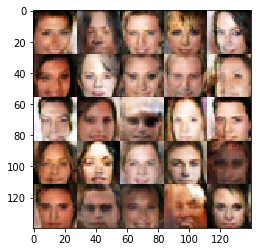

Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.6823
Epoch 1/1... Discriminator Loss: 1.1098... Generator Loss: 0.9346
Epoch 1/1... Discriminator Loss: 1.0817... Generator Loss: 0.7930
Epoch 1/1... Discriminator Loss: 1.3101... Generator Loss: 0.6237
Epoch 1/1... Discriminator Loss: 1.2105... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.1458... Generator Loss: 0.9278
Epoch 1/1... Discriminator Loss: 1.1718... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.7039
Epoch 1/1... Discriminator Loss: 1.2642... Generator Loss: 0.6535
Epoch 1/1... Discriminator Loss: 1.1515... Generator Loss: 0.7338


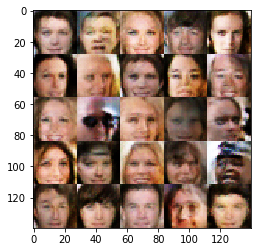

Epoch 1/1... Discriminator Loss: 1.0854... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.0425... Generator Loss: 0.9096
Epoch 1/1... Discriminator Loss: 1.1288... Generator Loss: 0.7539
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.6863
Epoch 1/1... Discriminator Loss: 1.5256... Generator Loss: 0.5933
Epoch 1/1... Discriminator Loss: 1.0537... Generator Loss: 0.8729
Epoch 1/1... Discriminator Loss: 1.1613... Generator Loss: 0.7670
Epoch 1/1... Discriminator Loss: 1.2717... Generator Loss: 0.6861
Epoch 1/1... Discriminator Loss: 1.0786... Generator Loss: 0.8092
Epoch 1/1... Discriminator Loss: 1.2543... Generator Loss: 0.7905


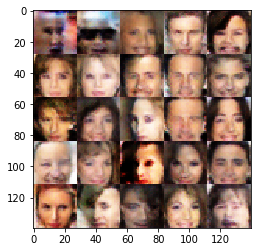

Epoch 1/1... Discriminator Loss: 1.0443... Generator Loss: 0.8319
Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 0.9326
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.5878
Epoch 1/1... Discriminator Loss: 1.0904... Generator Loss: 0.8891
Epoch 1/1... Discriminator Loss: 0.9771... Generator Loss: 0.9988
Epoch 1/1... Discriminator Loss: 1.2420... Generator Loss: 0.6457
Epoch 1/1... Discriminator Loss: 1.0697... Generator Loss: 0.8575
Epoch 1/1... Discriminator Loss: 1.0791... Generator Loss: 0.8620
Epoch 1/1... Discriminator Loss: 1.2813... Generator Loss: 0.7202
Epoch 1/1... Discriminator Loss: 1.1985... Generator Loss: 0.8475


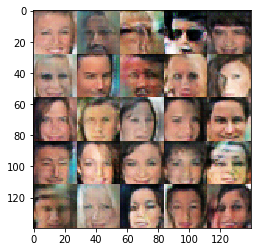

Epoch 1/1... Discriminator Loss: 1.0171... Generator Loss: 0.8743
Epoch 1/1... Discriminator Loss: 1.0308... Generator Loss: 0.8767
Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.6453
Epoch 1/1... Discriminator Loss: 1.1217... Generator Loss: 0.8270
Epoch 1/1... Discriminator Loss: 1.1401... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.0641... Generator Loss: 0.8570
Epoch 1/1... Discriminator Loss: 1.2915... Generator Loss: 0.6592
Epoch 1/1... Discriminator Loss: 1.4662... Generator Loss: 0.4649
Epoch 1/1... Discriminator Loss: 1.4393... Generator Loss: 0.4755
Epoch 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.8965


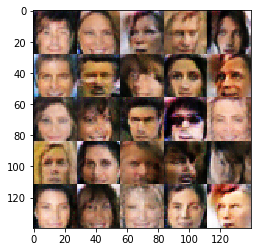

Epoch 1/1... Discriminator Loss: 1.2073... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.5262
Epoch 1/1... Discriminator Loss: 1.3286... Generator Loss: 0.6032
Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 0.7369
Epoch 1/1... Discriminator Loss: 1.2132... Generator Loss: 0.6983
Epoch 1/1... Discriminator Loss: 1.1251... Generator Loss: 0.8249
Epoch 1/1... Discriminator Loss: 0.9709... Generator Loss: 1.0665
Epoch 1/1... Discriminator Loss: 1.0424... Generator Loss: 1.0042
Epoch 1/1... Discriminator Loss: 1.0546... Generator Loss: 0.8055
Epoch 1/1... Discriminator Loss: 1.2262... Generator Loss: 0.6541


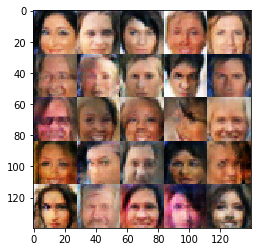

Epoch 1/1... Discriminator Loss: 1.1788... Generator Loss: 0.8128
Epoch 1/1... Discriminator Loss: 1.0825... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 1.0810... Generator Loss: 0.8454
Epoch 1/1... Discriminator Loss: 1.1828... Generator Loss: 0.6822
Epoch 1/1... Discriminator Loss: 1.2395... Generator Loss: 0.7641
Epoch 1/1... Discriminator Loss: 1.6721... Generator Loss: 0.3897
Epoch 1/1... Discriminator Loss: 1.0756... Generator Loss: 0.9394
Epoch 1/1... Discriminator Loss: 1.0662... Generator Loss: 0.8775
Epoch 1/1... Discriminator Loss: 1.1498... Generator Loss: 0.7670


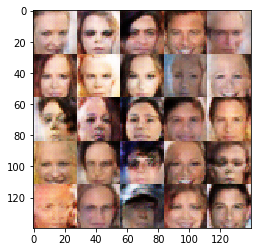

Epoch 1/1... Discriminator Loss: 1.1374... Generator Loss: 0.8310
Epoch 1/1... Discriminator Loss: 1.1689... Generator Loss: 0.9085
Epoch 1/1... Discriminator Loss: 1.4425... Generator Loss: 0.5821
Epoch 1/1... Discriminator Loss: 1.0238... Generator Loss: 0.9434
Epoch 1/1... Discriminator Loss: 1.0663... Generator Loss: 0.8602
Epoch 1/1... Discriminator Loss: 1.3561... Generator Loss: 0.6237
Epoch 1/1... Discriminator Loss: 1.1987... Generator Loss: 0.6616
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.7612
Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 0.8355
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.6015


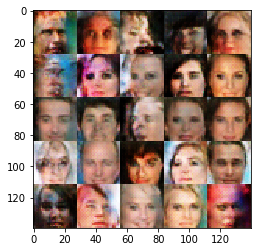

Epoch 1/1... Discriminator Loss: 1.2760... Generator Loss: 0.5789
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.5052
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.5271... Generator Loss: 0.4513
Epoch 1/1... Discriminator Loss: 1.0113... Generator Loss: 0.9168
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 0.7335
Epoch 1/1... Discriminator Loss: 1.2498... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.6149
Epoch 1/1... Discriminator Loss: 1.1022... Generator Loss: 0.8116
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.6250


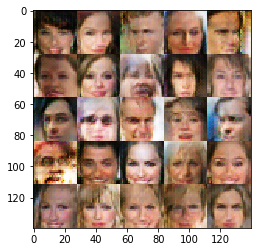

Epoch 1/1... Discriminator Loss: 0.9427... Generator Loss: 1.1407
Epoch 1/1... Discriminator Loss: 1.0867... Generator Loss: 0.9363
Epoch 1/1... Discriminator Loss: 0.9876... Generator Loss: 0.9448
Epoch 1/1... Discriminator Loss: 1.2499... Generator Loss: 0.6533
Epoch 1/1... Discriminator Loss: 1.1781... Generator Loss: 0.6809
Epoch 1/1... Discriminator Loss: 1.1258... Generator Loss: 0.7955


In [13]:
#在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它
batch_size = 16
z_dim = 100
learning_rate = 0.0004
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.